In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import scipy
import warnings
warnings.filterwarnings('ignore') 
from scipy import stats
import re 
from wordcloud import WordCloud, STOPWORDS
np.set_printoptions(suppress=True)


In [2]:
# 1. Read information basic dataset

In [3]:
file_path = r'C:\Users\Darius\Desktop\KIEM VIEC\HO SO XIN VIEC\REPORT\YOUTUBE\Global Youtube Statistics.csv'

data = pd.read_csv(file_path, encoding='latin-1')

In [4]:
data.head()

,rank,Youtuber,subscribers,video views,category,Title,uploads,Country,Abbreviation,channel_type,...,subscribers_for_last_30_days,created_year,created_month,created_date,Gross tertiary education enrollment (%),Population,Unemployment rate,Urban_population,Latitude,Longitude
0,1,T-Series,245000000,2.280000e+11,Music,T-Series,20082,India,IN,Music,...,2000000.0,2006.0,Mar,13.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880
1,2,YouTube Movies,170000000,0.000000e+00,Film & Animation,youtubemovies,1,United States,US,Games,...,NaN,2006.0,Mar,5.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891
2,3,MrBeast,166000000,2.836884e+10,Entertainment,MrBeast,741,United States,US,Entertainment,...,8000000.0,2012.0,Feb,20.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891
3,4,Cocomelon - Nursery Rhymes,162000000,1.640000e+11,Education,Cocomelon - Nursery Rhymes,966,United States,US,Education,...,1000000.0,2006.0,Sep,1.0,88.2,3.282395e+08,14.70,270663028.0,37.090240,-95.712891
4,5,SET India,159000000,1.480000e+11,Shows,SET India,116536,India,IN,Entertainment,...,1000000.0,2006.0,Sep,20.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880


In [5]:
data.tail()

,rank,Youtuber,subscribers,video views,category,Title,uploads,Country,Abbreviation,channel_type,...,subscribers_for_last_30_days,created_year,created_month,created_date,Gross tertiary education enrollment (%),Population,Unemployment rate,Urban_population,Latitude,Longitude
990,991,Natan por Aï¿,12300000,9.029610e+09,Sports,Natan por Aï¿,1200,Brazil,BR,Entertainment,...,700000.0,2017.0,Feb,12.0,51.3,2.125594e+08,12.08,183241641.0,-14.235004,-51.925280
991,992,Free Fire India Official,12300000,1.674410e+09,People & Blogs,Free Fire India Official,1500,India,IN,Games,...,300000.0,2018.0,Sep,14.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880
992,993,Panda,12300000,2.214684e+09,NaN,HybridPanda,2452,United Kingdom,GB,Games,...,1000.0,2006.0,Sep,11.0,60.0,6.683440e+07,3.85,55908316.0,55.378051,-3.435973
993,994,RobTopGames,12300000,3.741235e+08,Gaming,RobTopGames,39,Sweden,SE,Games,...,100000.0,2012.0,May,9.0,67.0,1.028545e+07,6.48,9021165.0,60.128161,18.643501
994,995,Make Joke Of,12300000,2.129774e+09,Comedy,Make Joke Of,62,India,IN,Comedy,...,100000.0,2017.0,Aug,1.0,28.1,1.366418e+09,5.36,471031528.0,20.593684,78.962880


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 995 entries, 0 to 994
Data columns (total 28 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   rank                                     995 non-null    int64  
 1   Youtuber                                 995 non-null    object 
 2   subscribers                              995 non-null    int64  
 3   video views                              995 non-null    float64
 4   category                                 949 non-null    object 
 5   Title                                    995 non-null    object 
 6   uploads                                  995 non-null    int64  
 7   Country                                  873 non-null    object 
 8   Abbreviation                             873 non-null    object 
 9   channel_type                             965 non-null    object 
 10  video_views_rank                         994 non-n

In [7]:
# clean columns in the dataset

In [8]:
data.columns= data.columns.str.replace('_', ' ')
data.columns= data.columns.str.title()
data.columns

Index(['Rank', 'Youtuber', 'Subscribers', 'Video Views', 'Category', 'Title',
       'Uploads', 'Country', 'Abbreviation', 'Channel Type',
       'Video Views Rank', 'Country Rank', 'Channel Type Rank',
       'Video Views For The Last 30 Days', 'Lowest Monthly Earnings',
       'Highest Monthly Earnings', 'Lowest Yearly Earnings',
       'Highest Yearly Earnings', 'Subscribers For Last 30 Days',
       'Created Year', 'Created Month', 'Created Date',
       'Gross Tertiary Education Enrollment (%)', 'Population',
       'Unemployment Rate', 'Urban Population', 'Latitude', 'Longitude'],
      dtype='object')

In [9]:
# 2. SELECT VARIABLES TO ANALYST

In [10]:
youtube = data[['Youtuber', 'Subscribers',
                'Video Views', 'Uploads', 'Category',
                'Country', 'Abbreviation', 'Lowest Monthly Earnings',
                'Highest Monthly Earnings', 'Gross Tertiary Education Enrollment (%)',
                'Unemployment Rate', 'Population',
                'Urban Population', 'Created Year']]

In [11]:
youtube.head()

,Youtuber,Subscribers,Video Views,Uploads,Category,Country,Abbreviation,Lowest Monthly Earnings,Highest Monthly Earnings,Gross Tertiary Education Enrollment (%),Unemployment Rate,Population,Urban Population,Created Year
0,T-Series,245000000,2.280000e+11,20082,Music,India,IN,564600.0,9000000.00,28.1,5.36,1.366418e+09,471031528.0,2006.0
1,YouTube Movies,170000000,0.000000e+00,1,Film & Animation,United States,US,0.0,0.05,88.2,14.70,3.282395e+08,270663028.0,2006.0
2,MrBeast,166000000,2.836884e+10,741,Entertainment,United States,US,337000.0,5400000.00,88.2,14.70,3.282395e+08,270663028.0,2012.0
3,Cocomelon - Nursery Rhymes,162000000,1.640000e+11,966,Education,United States,US,493800.0,7900000.00,88.2,14.70,3.282395e+08,270663028.0,2006.0
4,SET India,159000000,1.480000e+11,116536,Shows,India,IN,455900.0,7300000.00,28.1,5.36,1.366418e+09,471031528.0,2006.0


In [12]:
# There are special characters in the Youtuber and Title columns that need to be fixed

In [13]:
import re

pattern = r'[^a-zA-Z0-9\s]'

# 
youtube['Youtuber'] = youtube['Youtuber'].apply(lambda x: re.sub(pattern, '', x)) 
youtube['Youtuber'] = youtube['Youtuber'].str.strip()
youtube['Youtuber'] = youtube['Youtuber'].str.lstrip('- ')


In [14]:
#check special characters in Youtuber feature
filter_youtuber_rows = youtube['Youtuber'].str.contains(pattern, regex = True) 
filter_youtuber_rows_results = filter_youtuber_rows[filter_youtuber_rows == True] 
print("Youtuber's special characters:",filter_youtuber_rows_results)

Youtuber's special characters: Series([], Name: Youtuber, dtype: bool)


In [15]:
youtube.head()

,Youtuber,Subscribers,Video Views,Uploads,Category,Country,Abbreviation,Lowest Monthly Earnings,Highest Monthly Earnings,Gross Tertiary Education Enrollment (%),Unemployment Rate,Population,Urban Population,Created Year
0,TSeries,245000000,2.280000e+11,20082,Music,India,IN,564600.0,9000000.00,28.1,5.36,1.366418e+09,471031528.0,2006.0
1,YouTube Movies,170000000,0.000000e+00,1,Film & Animation,United States,US,0.0,0.05,88.2,14.70,3.282395e+08,270663028.0,2006.0
2,MrBeast,166000000,2.836884e+10,741,Entertainment,United States,US,337000.0,5400000.00,88.2,14.70,3.282395e+08,270663028.0,2012.0
3,Cocomelon Nursery Rhymes,162000000,1.640000e+11,966,Education,United States,US,493800.0,7900000.00,88.2,14.70,3.282395e+08,270663028.0,2006.0
4,SET India,159000000,1.480000e+11,116536,Shows,India,IN,455900.0,7300000.00,28.1,5.36,1.366418e+09,471031528.0,2006.0


In [16]:
youtube.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 995 entries, 0 to 994
Data columns (total 14 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Youtuber                                 995 non-null    object 
 1   Subscribers                              995 non-null    int64  
 2   Video Views                              995 non-null    float64
 3   Uploads                                  995 non-null    int64  
 4   Category                                 949 non-null    object 
 5   Country                                  873 non-null    object 
 6   Abbreviation                             873 non-null    object 
 7   Lowest Monthly Earnings                  995 non-null    float64
 8   Highest Monthly Earnings                 995 non-null    float64
 9   Gross Tertiary Education Enrollment (%)  872 non-null    float64
 10  Unemployment Rate                        872 non-n

In [17]:
youtube.columns

Index(['Youtuber', 'Subscribers', 'Video Views', 'Uploads', 'Category',
       'Country', 'Abbreviation', 'Lowest Monthly Earnings',
       'Highest Monthly Earnings', 'Gross Tertiary Education Enrollment (%)',
       'Unemployment Rate', 'Population', 'Urban Population', 'Created Year'],
      dtype='object')

In [18]:
#Remove data null in column 'Created Year'
youtube = youtube.dropna(subset= ['Created Year']) 
youtube['Created Year'] = youtube['Created Year'].astype('object')

In [19]:
youtube.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 990 entries, 0 to 994
Data columns (total 14 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Youtuber                                 990 non-null    object 
 1   Subscribers                              990 non-null    int64  
 2   Video Views                              990 non-null    float64
 3   Uploads                                  990 non-null    int64  
 4   Category                                 944 non-null    object 
 5   Country                                  870 non-null    object 
 6   Abbreviation                             870 non-null    object 
 7   Lowest Monthly Earnings                  990 non-null    float64
 8   Highest Monthly Earnings                 990 non-null    float64
 9   Gross Tertiary Education Enrollment (%)  869 non-null    float64
 10  Unemployment Rate                        869 non-n

In [20]:
#Check Created Year data 
youtube['Created Year'].unique()

array([2006.0, 2012.0, 2013.0, 2015.0, 2010.0, 2016.0, 2018.0, 2014.0,
       2007.0, 2020.0, 2008.0, 2005.0, 2011.0, 2009.0, 2017.0, 2021.0,
       1970.0, 2019.0, 2022.0], dtype=object)

In [21]:
#Check Created Year is 1970 
youtube[youtube['Created Year'] == 1970]

,Youtuber,Subscribers,Video Views,Uploads,Category,Country,Abbreviation,Lowest Monthly Earnings,Highest Monthly Earnings,Gross Tertiary Education Enrollment (%),Unemployment Rate,Population,Urban Population,Created Year
101,YouTube,36300000,3.010785e+09,744,News & Politics,United States,US,5300.0,84400.0,88.2,14.7,328239523.0,270663028.0,1970.0


#### 
YouTube was founded on February 14, 2005. We can observe a discrepancy in the establishment date of this YouTube channel. Since this could be a representative channel for the YouTube platform, we will temporarily replace the channel's founding date with the inception date of YouTube.

In [22]:
youtube[youtube['Youtuber'] == 'YouTube'] = youtube[youtube['Youtuber'] == 'YouTube'].replace(1970, 2005) 
youtube[youtube['Youtuber'] == 'YouTube']

,Youtuber,Subscribers,Video Views,Uploads,Category,Country,Abbreviation,Lowest Monthly Earnings,Highest Monthly Earnings,Gross Tertiary Education Enrollment (%),Unemployment Rate,Population,Urban Population,Created Year
101,YouTube,36300000,3.010785e+09,744,News & Politics,United States,US,5300.0,84400.0,88.2,14.7,328239523.0,270663028.0,2005


In [23]:
youtube['Created Year'].unique()

array([2006.0, 2012.0, 2013.0, 2015.0, 2010.0, 2016.0, 2018.0, 2014.0,
       2007.0, 2020.0, 2008.0, 2005.0, 2011.0, 2009.0, 2017.0, 2021.0,
       2019.0, 2022.0], dtype=object)

In [24]:
#After remomved characters, we will some blanks data in column 'Youtuber'. Let's check it 
blanks_data_youtuber = youtube[youtube['Youtuber'] == ''] 
blanks_data_youtuber

,Youtuber,Subscribers,Video Views,Uploads,Category,Country,Abbreviation,Lowest Monthly Earnings,Highest Monthly Earnings,Gross Tertiary Education Enrollment (%),Unemployment Rate,Population,Urban Population,Created Year
64,,43200000,3.645873e+10,1478,Film & Animation,Russia,RU,75900.0,1200000.0,81.9,4.59,144373535.0,107683889.0,2011.0
161,,30400000,1.799996e+10,532,NaN,United States,US,30700.0,491700.0,88.2,14.70,328239523.0,270663028.0,2018.0
433,,19000000,4.924054e+09,60,Education,United States,US,5400.0,86300.0,88.2,14.70,328239523.0,270663028.0,2018.0
447,,18800000,9.594189e+09,530,Entertainment,Ukraine,UA,17000.0,272000.0,82.7,8.88,44385155.0,30835699.0,2014.0
561,,16500000,2.440934e+09,421,Entertainment,United States,US,5500.0,87800.0,88.2,14.70,328239523.0,270663028.0,2014.0
606,,15900000,1.845330e+09,0,People & Blogs,Russia,RU,0.0,0.0,81.9,4.59,144373535.0,107683889.0,2017.0
632,,15500000,8.265130e+09,1021,Shows,Saudi Arabia,SA,33800.0,540100.0,68.0,5.93,34268528.0,28807838.0,2017.0
700,,14900000,4.390980e+05,1,People & Blogs,Russia,RU,2.0,31.0,81.9,4.59,144373535.0,107683889.0,2008.0
707,,14800000,7.018015e+09,2387,Howto & Style,Ukraine,UA,11800.0,188500.0,82.7,8.88,44385155.0,30835699.0,2015.0
714,,14700000,2.230986e+09,1385,Entertainment,Saudi Arabia,SA,673.0,10800.0,68.0,5.93,34268528.0,28807838.0,2016.0


In [25]:
# Remove rows from with blank Youtuber as these are channels with only special characters 
youtube = youtube.drop(blanks_data_youtuber.index) 
youtube.reset_index(drop= True, inplace= True) 
youtube[youtube['Youtuber'] == '']

,Youtuber,Subscribers,Video Views,Uploads,Category,Country,Abbreviation,Lowest Monthly Earnings,Highest Monthly Earnings,Gross Tertiary Education Enrollment (%),Unemployment Rate,Population,Urban Population,Created Year


In [26]:
#Check duplicate data
youtube.duplicated().sum()

0

In [27]:
#Check zero data video views
zero_views = youtube[youtube['Video Views'] == 0] 
zero_views

,Youtuber,Subscribers,Video Views,Uploads,Category,Country,Abbreviation,Lowest Monthly Earnings,Highest Monthly Earnings,Gross Tertiary Education Enrollment (%),Unemployment Rate,Population,Urban Population,Created Year
1,YouTube Movies,170000000,0.0,1,Film & Animation,United States,US,0.0,0.05,88.2,14.7,328239523.0,270663028.0,2006.0
5,Music,119000000,0.0,0,NaN,NaN,NaN,0.0,0.00,NaN,NaN,NaN,NaN,2013.0
12,Gaming,93600000,0.0,0,NaN,NaN,NaN,0.0,0.00,NaN,NaN,NaN,NaN,2013.0
18,Sports,75000000,0.0,3,NaN,United States,US,0.0,0.06,88.2,14.7,328239523.0,270663028.0,2006.0
101,News,36300000,0.0,0,NaN,NaN,NaN,0.0,0.00,NaN,NaN,NaN,NaN,2013.0
171,Popular on YouTube,29300000,0.0,3,NaN,NaN,NaN,0.0,0.00,NaN,NaN,NaN,NaN,2017.0
357,Minecraft Topic,20900000,0.0,0,NaN,NaN,NaN,0.0,0.00,NaN,NaN,NaN,NaN,2013.0
584,Live,16100000,0.0,0,NaN,NaN,NaN,0.0,0.00,NaN,NaN,NaN,NaN,2015.0


#### There are a number of YouTube channels which have 0 video views, these appear to be YouTube topics & not valid channels, for the purpose of this analysis these rows will be removed

In [28]:
#Remove zero data video views
youtube = youtube.drop(zero_views.index) 
youtube.reset_index(drop= True, inplace= True) 
youtube[youtube['Video Views'] == 0]


,Youtuber,Subscribers,Video Views,Uploads,Category,Country,Abbreviation,Lowest Monthly Earnings,Highest Monthly Earnings,Gross Tertiary Education Enrollment (%),Unemployment Rate,Population,Urban Population,Created Year


In [29]:
youtube.shape

(966, 14)

In [30]:
#check null/nan data
youtube.isnull().sum()

Youtuber                                     0
Subscribers                                  0
Video Views                                  0
Uploads                                      0
Category                                    37
Country                                    113
Abbreviation                               113
Lowest Monthly Earnings                      0
Highest Monthly Earnings                     0
Gross Tertiary Education Enrollment (%)    114
Unemployment Rate                          114
Population                                 114
Urban Population                           114
Created Year                                 0
dtype: int64

In [31]:
#There are lots of missing value in the category variables
#We will filter all missing to 'Other'
#Select category columns 
categorical_variables = youtube.select_dtypes(include= 'O').columns
#Replace object datatype column missing values with 'Other'
youtube[categorical_variables] = youtube[categorical_variables].fillna('Other')

In [32]:
#check missing value 
youtube.isna().sum()


Youtuber                                     0
Subscribers                                  0
Video Views                                  0
Uploads                                      0
Category                                     0
Country                                      0
Abbreviation                                 0
Lowest Monthly Earnings                      0
Highest Monthly Earnings                     0
Gross Tertiary Education Enrollment (%)    114
Unemployment Rate                          114
Population                                 114
Urban Population                           114
Created Year                                 0
dtype: int64

In [33]:
youtube.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 966 entries, 0 to 965
Data columns (total 14 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Youtuber                                 966 non-null    object 
 1   Subscribers                              966 non-null    int64  
 2   Video Views                              966 non-null    float64
 3   Uploads                                  966 non-null    int64  
 4   Category                                 966 non-null    object 
 5   Country                                  966 non-null    object 
 6   Abbreviation                             966 non-null    object 
 7   Lowest Monthly Earnings                  966 non-null    float64
 8   Highest Monthly Earnings                 966 non-null    float64
 9   Gross Tertiary Education Enrollment (%)  852 non-null    float64
 10  Unemployment Rate                        852 non-n

In [34]:
#Youtube is not null
youtube_not_null = youtube.dropna(subset= ['Gross Tertiary Education Enrollment (%)','Unemployment Rate', 'Population'])

In [35]:
#Mean Education Enrollment
mean_edu = round(youtube_not_null['Gross Tertiary Education Enrollment (%)'].mean(),1) 
print('Mean Gross Tertiary Education Enrollment:', mean_edu)
#Mean Unemployment Rate
mean_unemp = round(youtube_not_null['Unemployment Rate'].mean(),1)
print('Mean Unemployment Rate:', mean_unemp)
#Mean Population
mean_popu = round(youtube_not_null['Population'].mean(),0)
print('Mean Population:', mean_popu)
#Mean  
mean_urban = round(youtube_not_null['Urban Population'].mean(),0)
print('Mean Urban Population:', mean_urban)

Mean Gross Tertiary Education Enrollment: 63.2
Mean Unemployment Rate: 9.3
Mean Population: 436369043.0
Mean Urban Population: 226156206.0


In [36]:
# Replace missing values in the 'Gross Tertiary Education Enrollment (%)' column with its mean value
mean_value = youtube['Gross Tertiary Education Enrollment (%)'].mean()
youtube['Gross Tertiary Education Enrollment (%)'].fillna(mean_value, inplace=True)

In [37]:
youtube['Unemployment Rate'] = youtube['Unemployment Rate'].fillna(mean_unemp) 
youtube['Population'] = youtube['Population'].fillna(mean_popu) 
youtube['Urban Population'] = youtube['Urban Population'].fillna(mean_urban)

In [38]:
youtube.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 966 entries, 0 to 965
Data columns (total 14 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Youtuber                                 966 non-null    object 
 1   Subscribers                              966 non-null    int64  
 2   Video Views                              966 non-null    float64
 3   Uploads                                  966 non-null    int64  
 4   Category                                 966 non-null    object 
 5   Country                                  966 non-null    object 
 6   Abbreviation                             966 non-null    object 
 7   Lowest Monthly Earnings                  966 non-null    float64
 8   Highest Monthly Earnings                 966 non-null    float64
 9   Gross Tertiary Education Enrollment (%)  966 non-null    float64
 10  Unemployment Rate                        966 non-n

In [39]:
# Convert several float data typescolumns to integars 
youtube = youtube.astype({
'Video Views': 'int64', 'Created Year': 'int64',
'Population': 'int64',
'Urban Population': 'int64'
})
# Validate results of datatype change youtube.info()
youtube.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 966 entries, 0 to 965
Data columns (total 14 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Youtuber                                 966 non-null    object 
 1   Subscribers                              966 non-null    int64  
 2   Video Views                              966 non-null    int64  
 3   Uploads                                  966 non-null    int64  
 4   Category                                 966 non-null    object 
 5   Country                                  966 non-null    object 
 6   Abbreviation                             966 non-null    object 
 7   Lowest Monthly Earnings                  966 non-null    float64
 8   Highest Monthly Earnings                 966 non-null    float64
 9   Gross Tertiary Education Enrollment (%)  966 non-null    float64
 10  Unemployment Rate                        966 non-n

In [40]:
#sorting the dataframe and resetting index (by 'Subscribers)
youtube = youtube.sort_values(
            by = 'Subscribers', ascending= False).reset_index(drop= True) 
youtube

,Youtuber,Subscribers,Video Views,Uploads,Category,Country,Abbreviation,Lowest Monthly Earnings,Highest Monthly Earnings,Gross Tertiary Education Enrollment (%),Unemployment Rate,Population,Urban Population,Created Year
0,TSeries,245000000,228000000000,20082,Music,India,IN,564600.0,9000000.0,28.1,5.36,1366417754,471031528,2006
1,MrBeast,166000000,28368841870,741,Entertainment,United States,US,337000.0,5400000.0,88.2,14.70,328239523,270663028,2012
2,Cocomelon Nursery Rhymes,162000000,164000000000,966,Education,United States,US,493800.0,7900000.0,88.2,14.70,328239523,270663028,2006
3,SET India,159000000,148000000000,116536,Shows,India,IN,455900.0,7300000.0,28.1,5.36,1366417754,471031528,2006
4,Kids Diana Show,112000000,93247040539,1111,People & Blogs,United States,US,182900.0,2900000.0,88.2,14.70,328239523,270663028,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
961,Natan por A,12300000,9029609749,1200,Sports,Brazil,BR,138100.0,2200000.0,51.3,12.08,212559417,183241641,2017
962,Free Fire India Official,12300000,1674409945,1500,People & Blogs,India,IN,16200.0,258900.0,28.1,5.36,1366417754,471031528,2018
963,Panda,12300000,2214684303,2452,Other,United Kingdom,GB,17.0,268.0,60.0,3.85,66834405,55908316,2006
964,RobTopGames,12300000,374123483,39,Gaming,Sweden,SE,968.0,15500.0,67.0,6.48,10285453,9021165,2012


In [41]:
# TO csv
cleaned_file_path = r'C:\Users\Darius\Desktop\KIEM VIEC\HO SO XIN VIEC\REPORT\YOUTUBE\Global_Youtube_2023_Cleaned.csv'
data.to_csv(cleaned_file_path, index=False)  #  index=False to not save index into file CSV

## 3. EXPLORATORY DATA ANALYSIS

In [42]:
# CREATE COLOR PATLETTES

In [43]:
youtube_color_barchart_10 = ['#f00000', '#ff2424', '#ff3838', '#ff554f', '#fb7571', '#cccccc', '#b6b6b6', '#9e9e9e', '#888888', '#666666']


In [44]:
youtube_color_donutchart = ['#f00000', '#ff3838', '#fb7571','#cccccc','#b6b6b6','#9e9e9e','#777777']

In [45]:
youtube_color_barchart_freestyle1 = ['#f00000', '#f00000', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777']


In [46]:
youtube_color_barchart_freestyle2 = ['#FE0000','#F4E0B9','#A8A196','#7D7463']


In [47]:
youtube_color_barchart_freestyle3 = ['#f00000', '#777777', '#777777', '#777777','#777777', '#777777', '#777777', '#777777','#777777']


In [48]:
# Correlation of Numeric Variables

In [49]:
#Statistics table correlation 
correlation = youtube.corr() 
correlation


,Subscribers,Video Views,Uploads,Lowest Monthly Earnings,Highest Monthly Earnings,Gross Tertiary Education Enrollment (%),Unemployment Rate,Population,Urban Population,Created Year
Subscribers,1.000000,0.823659,0.087606,0.427319,0.426945,-0.015453,-0.023950,0.083580,0.077677,-0.132192
Video Views,0.823659,1.000000,0.163997,0.549752,0.549121,-0.009460,0.000665,0.075701,0.072778,-0.137299
Uploads,0.087606,0.163997,1.000000,0.164597,0.164955,-0.214720,-0.189159,0.139848,0.069912,-0.163753
Lowest Monthly Earnings,0.427319,0.549752,0.164597,1.000000,0.999955,-0.053692,-0.040113,0.096322,0.074386,0.075421
Highest Monthly Earnings,0.426945,0.549121,0.164955,0.999955,1.000000,-0.053478,-0.039891,0.096296,0.074401,0.075385
Gross Tertiary Education Enrollment (%),-0.015453,-0.009460,-0.214720,-0.053692,-0.053478,1.000000,0.682986,-0.571518,-0.296061,-0.153969
Unemployment Rate,-0.023950,0.000665,-0.189159,-0.040113,-0.039891,0.682986,1.000000,-0.225163,0.132932,-0.120141
Population,0.083580,0.075701,0.139848,0.096322,0.096296,-0.571518,-0.225163,1.000000,0.910204,0.118703
Urban Population,0.077677,0.072778,0.069912,0.074386,0.074401,-0.296061,0.132932,0.910204,1.000000,0.080779
Created Year,-0.132192,-0.137299,-0.163753,0.075421,0.075385,-0.153969,-0.120141,0.118703,0.080779,1.000000


<AxesSubplot:title={'center':'Correlation Matrix Heatmap'}>

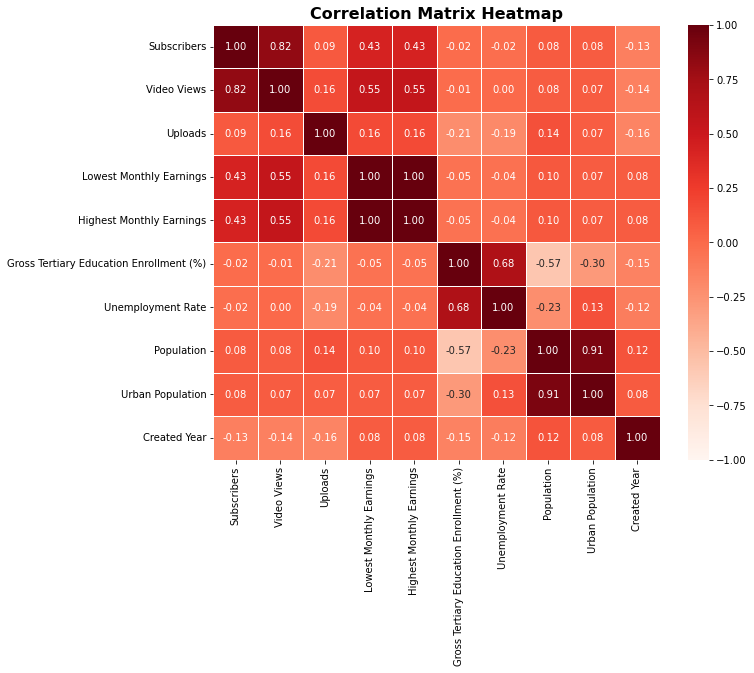

In [50]:
#Visualization heatmap
plt.figure(figsize= (10,8))
plt.title('Correlation Matrix Heatmap', fontweight = 'heavy', fontsize = 16) 
sb.heatmap(correlation, annot= True,
            cmap= 'Reds',
            vmin= -1, vmax= 1,
            linecolor = 'white', linewidths = 0.5,
            fmt = '.2f')


#### COMMENT:

Through the heatmap illustrating the correlation between continuous variables, it can be observed that there is a relatively high correlation between the variables `Subscribers` and `Video Views`. The correlation of these two variables with the remaining variables is only moderately weak, with no correlation observed with the variable `Uploads`.

The variables `Lowest Monthly Earnings` and `Highest Monthly Earnings` exhibit a perfect correlation with each other (100%).

### QUESTION 1:Who are the Top 10 YouTubers with the highest number of subscribers and the Top 10 YouTubers with the highest number of views?

In [51]:
#Statistics by Subscribers
#Select columns to show output
select_columns = ['Youtuber', 'Subscribers']
#Filter dataframe for top 10 most subscribers Youtuber channels 
top_10_subs = youtube[select_columns].head(10)
#Convert 'Subscriber' in millions
top_10_subs['Subscribers (million)'] = (top_10_subs['Subscribers'] / 1000000).astype('int')
top_10_subs = top_10_subs[['Youtuber', 'Subscribers (million)']]
#Show dataframe top_10_subs
top_10_subs

,Youtuber,Subscribers (million)
0,TSeries,245
1,MrBeast,166
2,Cocomelon Nursery Rhymes,162
3,SET India,159
4,Kids Diana Show,112
5,PewDiePie,111
6,Like Nastya,106
7,Vlad and Niki,98
8,Zee Music Company,96
9,WWE,96


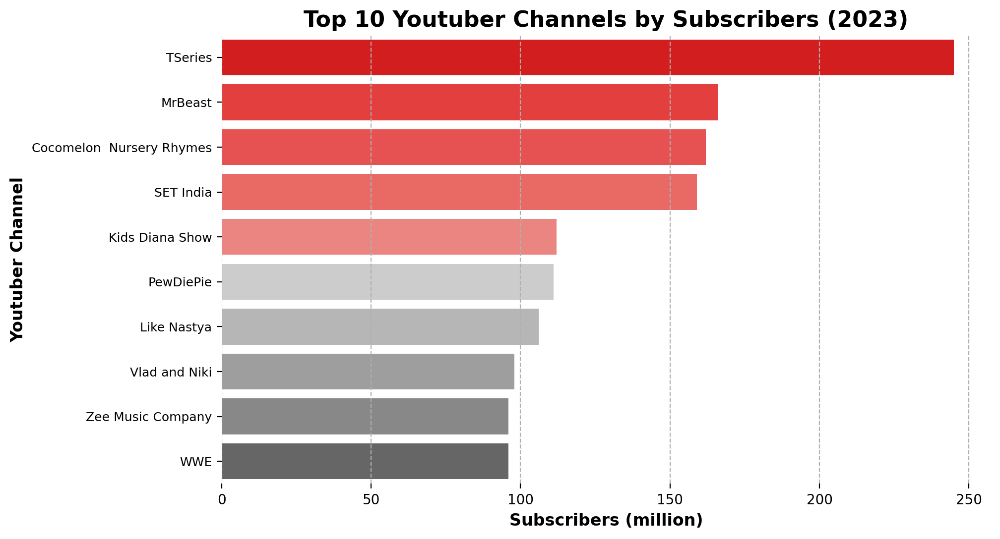

In [52]:
# Set a higher resolution (DPI) for the figure
plt.figure(figsize=(10, 6), dpi=200)  # Adjust the figsize and dpi values as needed
plt.title('Top 10 Youtuber Channels by Subscribers (2023)', fontweight='heavy', fontsize=16) 
sb.barplot(data=top_10_subs, x='Subscribers (million)', y='Youtuber', palette=youtube_color_barchart_10) 
plt.xlabel('Subscribers (million)', fontweight='heavy', fontsize=12)
plt.ylabel('Youtuber Channel', fontweight='heavy', fontsize=12) 
plt.yticks(size=9)
sb.despine(left=True, bottom=True) 
plt.grid(axis='x', linestyle='--') 
plt.show()


In [53]:
# Statistics by Video Views
# Select columns to show output
select_columns = ['Youtuber', 'Video Views']

# Filter dataframe for top 10 most video views Youtuber channels
youtube_videoviews = youtube[select_columns]
top_10_views = youtube_videoviews.sort_values(by='Video Views', ascending=False).head(10)

# Convert 'Video Views' to billions
top_10_views['Video Views (billion)'] = (top_10_views['Video Views'] / 1000000000).astype('int')

# Rearrange columns and sort by 'Video Views (billion)'
top_10_views = top_10_views[['Youtuber', 'Video Views (billion)']].sort_values(by='Video Views (billion)', ascending=False)


In [54]:
#Show dataframe
top_10_views


,Youtuber,Video Views (billion)
0,TSeries,228
2,Cocomelon Nursery Rhymes,164
3,SET India,148
12,Sony SAB,101
4,Kids Diana Show,93
6,Like Nastya,90
9,WWE,77
7,Vlad and Niki,77
17,Zee TV,73
22,Colors TV,61


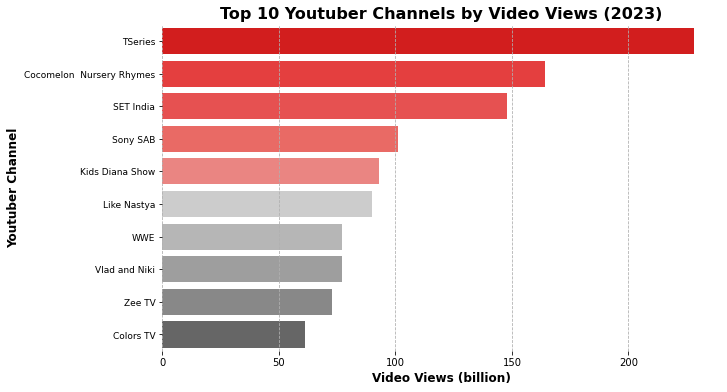

In [55]:
# Visualization
plt.figure(figsize=(10, 6)) 
plt.title('Top 10 Youtuber Channels by Video Views (2023)', fontweight='heavy', fontsize=16) 
sb.barplot(data=top_10_views, x='Video Views (billion)', y='Youtuber', palette=youtube_color_barchart_10) 
plt.xlabel('Video Views (billion)', fontweight='heavy', fontsize=12) 
plt.ylabel('Youtuber Channel', fontweight='heavy', fontsize=12) 
plt.yticks(size=9) 
sb.despine(left=True, bottom=True) 
plt.grid(axis='x', linestyle='--') 
plt.show()


#### 
Generally, looking at the two bar charts above, we can observe that 7 out of the top 10 channels with the highest number of subscribers are also present in the top 10 channels with the highest number of video views.

There is not much significant change in the rankings within the top 10 when transitioning from Subscribers to Video Views, except for the channel T-Series which maintains its top position in both categories.

So, is there any correlation between the number of subscribers and the number of views? Let's delve deeper into the relationship between these two variables in the next section.

## QUESTION 2:Does a YouTube channel with a higher number of subscribers correspond to a higher number of views?

In [56]:
# Statistics Subscriber (million), Video Views (billion) & Uploads (k.)
# Select columns to show output
select_columns = ['Youtuber', 'Subscribers', 'Video Views', 'Uploads']

# Filter dataframe by select_columns
youtube_corr_statistics = youtube[select_columns]

# Convert 'Subscribers' to millions
youtube_corr_statistics['Subscribers (million)'] = (youtube_corr_statistics['Subscribers'] / 1000000).astype('int')

# Convert 'Video Views' to billions
youtube_corr_statistics['Video Views (billion)'] = (youtube_corr_statistics['Video Views'] / 1000000000).astype('int')

# Convert 'Uploads' to thousand
youtube_corr_statistics['Uploads (k.)'] = (youtube_corr_statistics['Uploads'] / 1000).astype('int')

# Select relevant columns
youtube_corr_statistics = youtube_corr_statistics[['Youtuber', 'Subscribers (million)', 'Video Views (billion)', 'Uploads (k.)']]

# Show dataframe
youtube_corr_statistics.head()


,Youtuber,Subscribers (million),Video Views (billion),Uploads (k.)
0,TSeries,245,228,20
1,MrBeast,166,28,0
2,Cocomelon Nursery Rhymes,162,164,0
3,SET India,159,148,116
4,Kids Diana Show,112,93,1


In [57]:
youtube_corr_statistics['Video Views (billion)'].mean()

10.711180124223603

In [58]:
youtube_corr_statistics['Subscribers (million)'].mean()

22.27225672877847

In [59]:
per_subs = round(np.percentile(youtube_corr_statistics['Subscribers (million)'], 95))
per_views = round(np.percentile(youtube_corr_statistics['Video Views (billion)'], 95))

print('95% of YouTube channels have Subscribers below:', per_subs, 'million')
print('95% of YouTube channels have Video Views below:', per_views, 'billion')


95% of YouTube channels have Subscribers below: 46 million
95% of YouTube channels have Video Views below: 28 billion


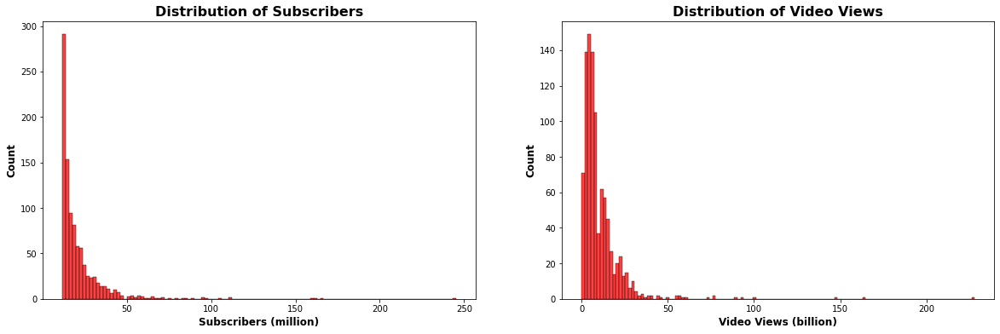

In [60]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

sb.histplot(youtube_corr_statistics['Subscribers (million)'], color='red', ax=ax1)
ax1.set_title('Distribution of Subscribers', fontweight='heavy', fontsize=16)
ax1.set_xlabel('Subscribers (million)', fontweight='heavy', fontsize=12)
ax1.set_ylabel('Count', fontweight='heavy', fontsize=12)

sb.histplot(youtube_corr_statistics['Video Views (billion)'], color='red', ax=ax2)
ax2.set_title('Distribution of Video Views', fontweight='heavy', fontsize=16)
ax2.set_xlabel('Video Views (billion)', fontweight='heavy', fontsize=12)
ax2.set_ylabel('Count', fontweight='heavy', fontsize=12)

plt.show()


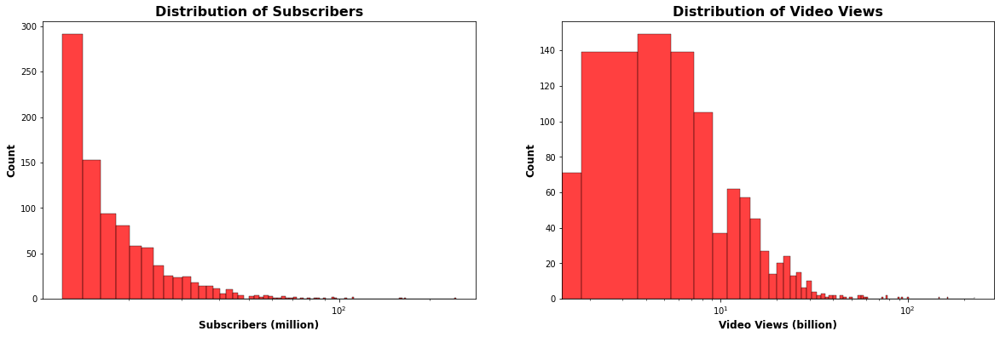

In [61]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

sb.histplot(youtube_corr_statistics['Subscribers (million)'], color='red', ax=ax1)
ax1.set_title('Distribution of Subscribers', fontweight='heavy', fontsize=16)
ax1.set_xlabel('Subscribers (million)', fontweight='heavy', fontsize=12)
ax1.set_ylabel('Count', fontweight='heavy', fontsize=12)
ax1.set_xscale('log')  # Apply logarithmic scale to x-axis

sb.histplot(youtube_corr_statistics['Video Views (billion)'], color='red', ax=ax2)
ax2.set_title('Distribution of Video Views', fontweight='heavy', fontsize=16)
ax2.set_xlabel('Video Views (billion)', fontweight='heavy', fontsize=12)
ax2.set_ylabel('Count', fontweight='heavy', fontsize=12)
ax2.set_xscale('log')  # Apply logarithmic scale to x-axis

plt.show()


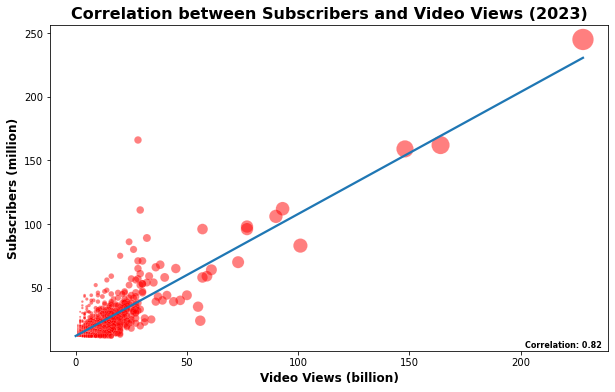

In [62]:
# Calculate the correlation coefficient
correlation = youtube_corr_statistics['Subscribers (million)'].corr(youtube_corr_statistics['Video Views (billion)'])

# Set scaling factor of circle size
scaling_factor = 2

# Calculate the size of circles
sizes = youtube_corr_statistics['Video Views (billion)'] * scaling_factor

# Chart
plt.figure(figsize=(10, 6))
plt.title('Correlation between Subscribers and Video Views (2023)', fontweight='heavy', fontsize=16)
sb.scatterplot(data=youtube_corr_statistics, x='Video Views (billion)', y='Subscribers (million)', color='red', alpha=0.5, s=sizes)
sb.regplot(data=youtube_corr_statistics, x='Video Views (billion)', y='Subscribers (million)', scatter=False, ci=None)
plt.xlabel('Video Views (billion)', fontweight='heavy', fontsize=12)
plt.ylabel('Subscribers (million)', fontweight='heavy', fontsize=12)

# Note correlation
plt.annotate(f'Correlation: {correlation:.2f}',
             xy=(0.85, 0.01),
             xycoords='axes fraction',
             fontsize=8,
             fontweight='heavy'
             )

plt.show()


#### comment:

From the results of the top 10 between subscribers and views with a correlation rate of up to 82%, we can observe a strong positive relationship between these two variables (a YouTube channel with more subscribers tends to have higher views).

Looking at the scatter plot, we notice that the majority of the data is concentrated in significantly lower ranges compared to the top 10 mentioned in the first question. Only a small portion of channels have significantly higher subscriber and view counts. Specifically, through the histplot, the data shows that up to 95% of YouTube channels have fewer than 46 million subscribers, and this percentage for views is under 28 billion.

This leads to the conclusion that:

There is indeed a significant dependency between the number of subscribers and views. Moreover, the numbers indicate that only a few channels truly excel compared to the rest in terms of success (measured based on subscribers and views).
So, the question arises: what factors contribute to the success of a YouTube channel?

## Question 3. Does uploading more videos on a YouTube channel lead to a higher number of subscribers and views?
 
To answer this question, we can analyze the correlation between the number of uploads, subscribers, and views on YouTube channels. We'll examine whether there's a positive relationship between these variables and if channels that upload more videos tend to have higher subscriber counts and view counts. We'll use statistical methods and visualization techniques to explore this relationship.

In [63]:
top_upload_channels = youtube[['Youtuber', 'Category', 'Uploads']].sort_values(by='Uploads', ascending=False).reset_index(drop=True)
top_upload_channels


,Youtuber,Category,Uploads
0,ABP NEWS,People & Blogs,301308
1,GMA Integrated News,News & Politics,296272
2,TV9 Bharatvarsh,People & Blogs,293516
3,Aaj Tak,News & Politics,283775
4,IndiaTV,News & Politics,273255
...,...,...,...
961,Aditya Music India,Music,0
962,TheRichest,Education,0
963,Major Lazer Official,Music,0
964,Ja Mill,People & Blogs,0


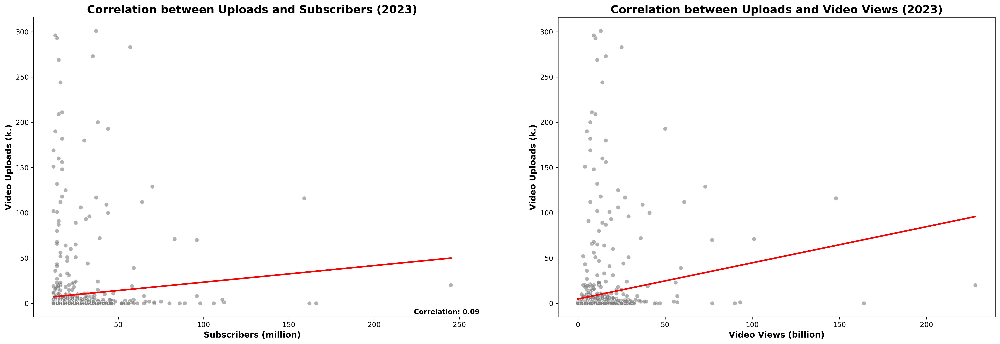

In [64]:
fig, ax = plt.subplots(1, 2, figsize=(25, 8), dpi =300)

# Upload & Subscribers
# Calculate the correlation coefficient
correlation_ax0 = youtube_corr_statistics['Uploads (k.)'].corr(youtube_corr_statistics['Subscribers (million)'])
# Set scaling factor of circle size
scaling_factor_ax0 = 2
# Calculate the size of circles
sizes_ax0 = youtube_corr_statistics['Subscribers (million)'] * scaling_factor_ax0
# Chart
ax[0].set_title('Correlation between Uploads and Subscribers (2023)', fontweight='heavy', fontsize=16)
sb.scatterplot(data=youtube_corr_statistics, x='Subscribers (million)', y='Uploads (k.)', color='gray', alpha=0.6, ax=ax[0])
sb.regplot(data=youtube_corr_statistics, x='Subscribers (million)', y='Uploads (k.)', scatter=False, ci=None, line_kws={'color': 'red'}, ax=ax[0])
ax[0].set_xlabel('Subscribers (million)', fontweight='heavy', fontsize=12)
ax[0].set_ylabel('Video Uploads (k.)', fontweight='heavy', fontsize=12)
ax[0].spines['top'].set_visible(False)  # Remove top spine
ax[0].spines['right'].set_visible(False)  # Remove right spine
# Note correlation
ax[0].annotate(f'Correlation: {correlation_ax0:.2f}',
               xy=(0.87, 0.01),
               xycoords='axes fraction',
               fontsize=10, weight='bold')

# Uploads & Video Views
# Calculate the correlation coefficient
correlation_ax1 = youtube_corr_statistics['Uploads (k.)'].corr(youtube_corr_statistics['Video Views (billion)'])
# Set scaling factor of circle size
scaling_factor_ax1 = 2
# Calculate the size of circles
sizes_ax1 = youtube_corr_statistics['Video Views (billion)'] * scaling_factor_ax1
# Chart
ax[1].set_title('Correlation between Uploads and Video Views (2023)', fontweight='heavy', fontsize=16)
sb.scatterplot(data=youtube_corr_statistics, x='Video Views (billion)', y='Uploads (k.)', color='gray', alpha=0.6, ax=ax[1])
sb.regplot(data=youtube_corr_statistics, x='Video Views (billion)', y='Uploads (k.)', scatter=False, ci=None, line_kws={'color': 'red'}, ax=ax[1])
ax[1].set_xlabel('Video Views (billion)', fontweight='heavy', fontsize=12)
ax[1].set_ylabel('Video Uploads (k.)', fontweight='heavy', fontsize=12)

plt.show()


### comment:
With extremely low correlation coefficients (0.9% and 17%, respectively) accompanied by inconsistent data dispersion, it can be concluded that a YouTube channel with many uploaded videos does not necessarily equate to receiving a large number of subscribers and views.

This implies that the quality and content of the videos may play a more significant role in attracting subscribers and viewers rather than focusing solely on the quantity of uploaded videos. Additionally, there is an exception indicated by the two scatter plots above, showing that a few channels exhibit a unique contrast where they have very low subscriber and view counts but significantly high numbers of uploaded videos. This could suggest the presence of a content niche being heavily exploited by organizations with ample resources and long-term operations.

It is more reasonable to speculate that these channels may belong to entertainment, news, or music categories known for uploading many short-duration videos on a 24-hour cycle, such as news headlines or interview excerpts.

=> So, which categories are being heavily exploited?

## Question 4:Which types of YouTube channels have the highest number of uploaded videos?

In [65]:
# Statistics by Category
# Group by various features by Category
statistics_category = youtube.groupby('Category').agg({'Category': 'count',
                                                        'Uploads': 'sum',
                                                        'Subscribers': 'sum',
                                                        'Video Views': 'sum'})

# Rename count feature
statistics_category = statistics_category.rename(columns={'Category': 'Count of Category'}).reset_index()

# Unit conversion
statistics_category['Video Views (billion)'] = (statistics_category['Video Views'] / 1000000000).astype('int')
statistics_category['Subscribers (million)'] = (statistics_category['Subscribers'] / 1000000).astype('int')
statistics_category['Uploads (k.)'] = (statistics_category['Uploads'] / 1000).astype('int')

# Select features
statistics_category = statistics_category[['Category', 'Count of Category', 'Uploads (k.)',
                                           'Subscribers (million)', 'Video Views (billion)']]

# Show statistics table
statistics_category


,Category,Count of Category,Uploads (k.),Subscribers (million),Video Views (billion)
0,Autos & Vehicles,2,3,35,15
1,Comedy,69,77,1388,550
2,Education,44,141,1175,691
3,Entertainment,235,2867,5061,2500
4,Film & Animation,44,127,1101,507
5,Gaming,92,403,1928,706
6,Howto & Style,39,64,760,194
7,Movies,2,7,51,15
8,Music,200,471,5155,3103
9,News & Politics,26,2924,536,270


In [66]:
# Select feature to summarize about Uploads
uploads_category = statistics_category[['Category', 'Uploads (k.)']]

# Group features with counts under 300 into the general category 'Other'
uploads_category.loc[uploads_category['Uploads (k.)'] < 300, 'Category'] = 'Other'

uploads_category = uploads_category.groupby(['Category'])['Uploads (k.)'].sum().reset_index().sort_values(by='Uploads (k.)', ascending=False)

# Calculate the total
total = sum(uploads_category['Uploads (k.)'])

# Calculate the percentage of uploads for each category
uploads_category['Percent Uploads (%)'] = [round((value / total) * 100, 0) for value in uploads_category['Uploads (k.)']]

uploads_category.reset_index(drop=True, inplace=True)

uploads_category


,Category,Uploads (k.),Percent Uploads (%)
0,News & Politics,2924,32.0
1,Entertainment,2867,31.0
2,People & Blogs,1212,13.0
3,Other,887,10.0
4,Music,471,5.0
5,Gaming,403,4.0
6,Shows,354,4.0


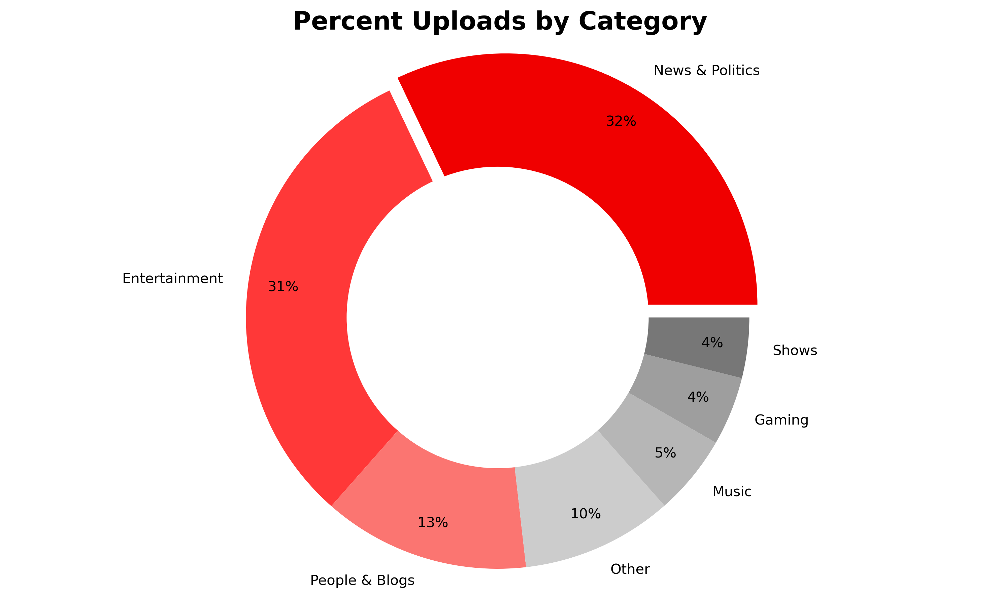

In [67]:
labels = uploads_category['Category']
sizes = uploads_category['Uploads (k.)']
explode = [0.06, 0, 0, 0, 0, 0, 0]

plt.figure(figsize=(10, 6), dpi=300)
plt.pie(sizes, labels=labels,
        autopct='%1.0f%%',
        startangle=0,
        explode=explode,
        colors=youtube_color_donutchart,
        pctdistance=0.86)

plt.title('Percent Uploads by Category', fontweight='heavy', fontsize=18)
plt.axis('equal')
plt.tight_layout()

# Draw a white circle at the center to make it a donut chart
circle = plt.Circle(xy=(0, 0), radius=0.6, facecolor='white')
plt.gca().add_artist(circle)

plt.show()


#### Comment:
The predictions made earlier are valid: Nearly 2/3 (63.5%) of the total uploads are evenly distributed between the News & Politics and Entertainment categories. Leading the pack is the News & Politics category with 32.1% (2924K uploads) of the total uploaded videos (with a marginal difference from the second position, Entertainment, at 31.4%). The remaining categories have a very small share.
So, what distinguishes these two categories from the rest?
News & Politics is a category that specializes in uploading videos about news and politics, including news reports, documentaries, interviews, discussions, and other TV programs. The content in this category requires accuracy and constantly updated information, meaning it tends to avoid revisiting old news stories. In fact, the topics in this category often require substantial resources behind the scenes. These could be government-owned and managed organizations, high-ranking departments with influence over the public, aiming to provide useful information to viewers. This is one of the exceptions on YouTube where the highest number of uploads does not depend on views and subscribers.
On the contrary, Entertainment is the leading entertainment category with diverse topics such as music, games, news-entertainment, movies-TV shows, etc. It's practically a category that can be utilized by almost anyone, regardless of size or type of organization, as it encompasses a wide range of topics, boosting the number of uploaded videos to nearly match the top position. YouTube channels in this category often rely heavily on views and subscribers, which are almost essential for driving and maintaining channel growth by individuals.
There is a growing trend of short-form video content being transmitted through platforms like TikTok, Instagram Reels, Facebook's Short-form videos, and YouTube Shorts. This model can generate a large number of uploads in a short period while still attracting a modern audience. Leading TikTokers, KOLs, etc., are at the forefront of producing short videos with minimal budgets, ranging from 30 seconds to 1 minute, yet still receiving significant interaction from multiple platforms, including YouTube.
So, is it true that the higher number of uploads in these two categories compared to others is because many YouTubers are exploiting these categories?
## 5. What is the number of YouTube channels in each category?

In [68]:
# Select features
count_category = statistics_category[['Category', 'Count of Category']].sort_values(by='Count of Category', ascending=False)


In [69]:
# Group features with counts under 300 into the general category other
count_category.loc[count_category['Count of Category'] < 20, 'Category'] = 'Other'
count_category = count_category.groupby(['Category'])['Count of Category'].sum().reset_index().sort_values(by='Count of Category', ascending=False)


In [70]:
count_category.reset_index(drop= True, inplace= True)


In [71]:
#Show statistics table 
count_category


,Category,Count of Category
0,Entertainment,235
1,Music,200
2,People & Blogs,128
3,Gaming,92
4,Other,89
5,Comedy,69
6,Education,44
7,Film & Animation,44
8,Howto & Style,39
9,News & Politics,26


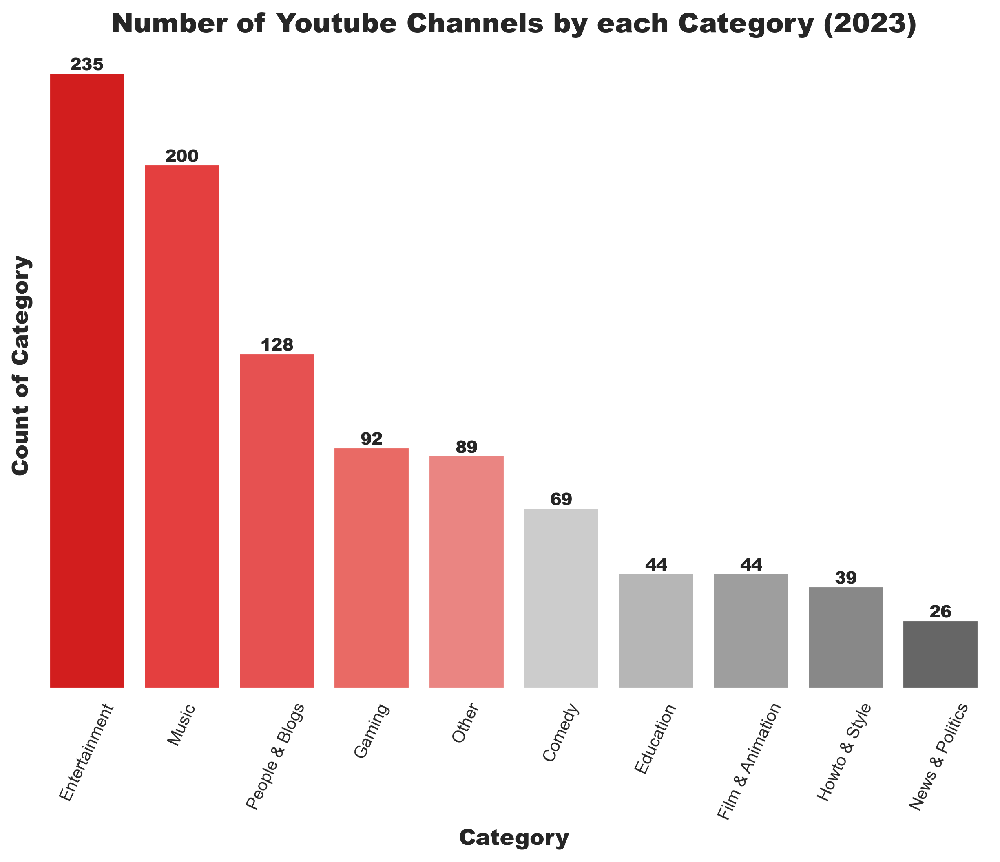

In [72]:
import seaborn as sb

sb.set_style("whitegrid", {'axes.grid': False})
plt.figure(figsize=(10, 7), dpi = 300)

# Select data for categories and values feature
cnt_category = count_category['Count of Category'].to_list()

# Chart
plt.title('Number of Youtube Channels by each Category (2023)', fontsize=16, fontweight='heavy')
sb.barplot(data=count_category, x='Category', y='Count of Category', palette=youtube_color_barchart_10)

# Add number for each columns
for i, value in enumerate(cnt_category):
    plt.text(i, value + 1, cnt_category[i], ha='center', fontsize=10, fontweight='heavy')

sb.despine(left=True, bottom=True)
plt.grid(axis='y', linestyle='--')
plt.xlabel('Category', fontsize=13, fontweight='heavy')
plt.ylabel('Count of Category', fontweight='heavy', fontsize=13)
plt.xticks(rotation=65)
plt.yticks([])  # Remove y-axis ticks
plt.show()


#### Comment:
We can see that with just 3 categories: Entertainment (236 channels), Music (202 channels), and People & Blogs (129 channels), they have accounted for nearly 60% of the total number of YouTube channels.
At the top position, as previously evidenced, the Entertainment category has the second highest number of Uploads Videos due to the diverse content that can be exploited by any individual or organization. This category is a gold mine for all individuals with creative abilities to tap into the technological age.
The diversity of music genres has created vast opportunities for music creators to reach a large audience. Along with its popularity, it is easy to create and share content with all users through various forms such as covers, self-composed videos, or content related to the music field they love. These are the reasons why Music has become the category with the second highest number of channels.
It is noteworthy that the Education, Howto & Style, and News & Politics categories are all at the bottom of the ranking. These categories convey useful content to viewers but have relatively limited numbers of channels. Some typical reasons mentioned above include the case of the News & Politics category, which requires a lot of resources to maintain and develop, in addition to strict requirements for content accuracy, which only a few organizations can handle. Education and channels containing instructional content on a specific area of life require special knowledge and experience in the field they want to convey, which somewhat limits the scope of creative, developmental, and sustainable channels.
=> So besides the reasons above, is it true that only because of diversity, popularity, or the availability of easily exploitable content by any individual that nearly 60% of the most successful channels focus on the Entertainment, Music, and People & Blogs categories? Or is this also the trend of YouTube users?

## 6.Trends of YouTube users through the number of subscribers and views in each category?

In [73]:
sub_youtuber_cate = youtube[['Youtuber', 'Category', 'Subscribers']].sort_values(by='Subscribers', ascending=False)
sub_youtuber_cate


,Youtuber,Category,Subscribers
0,TSeries,Music,245000000
1,MrBeast,Entertainment,166000000
2,Cocomelon Nursery Rhymes,Education,162000000
3,SET India,Shows,159000000
4,Kids Diana Show,People & Blogs,112000000
...,...,...,...
961,Natan por A,Sports,12300000
962,Free Fire India Official,People & Blogs,12300000
963,Panda,Other,12300000
964,RobTopGames,Gaming,12300000


In [74]:
# Select feature for subscribers chart
subs_category = statistics_category[['Category', 'Subscribers (million)']].sort_values(by='Subscribers (million)', ascending=False)
subs_category['Percent (%)'] = round((subs_category['Subscribers (million)'] / sum(subs_category['Subscribers (million)'])) * 100, 2)
subs_category.head()


,Category,Subscribers (million),Percent (%)
8,Music,5155,23.52
3,Entertainment,5061,23.09
12,People & Blogs,2720,12.41
5,Gaming,1928,8.79
1,Comedy,1388,6.33


In [75]:
view_youtuber_cate = youtube[['Youtuber', 'Category', 'Video Views']].sort_values(by='Video Views', ascending=False)
view_youtuber_cate.head()


,Youtuber,Category,Video Views
0,TSeries,Music,228000000000
2,Cocomelon Nursery Rhymes,Education,164000000000
3,SET India,Shows,148000000000
12,Sony SAB,Shows,101000000000
4,Kids Diana Show,People & Blogs,93247040539


In [76]:
views_category = statistics_category[['Category', 'Video Views (billion)']].sort_values(by='Video Views (billion)', ascending=False)
views_category['Percent (%)'] = round((views_category['Video Views (billion)'] / sum(views_category['Video Views (billion)'])) * 100, 2)
views_category


,Category,Video Views (billion),Percent (%)
8,Music,3103,28.69
3,Entertainment,2500,23.12
12,People & Blogs,1251,11.57
5,Gaming,706,6.53
2,Education,691,6.39
1,Comedy,550,5.09
4,Film & Animation,507,4.69
15,Shows,432,3.99
11,Other,278,2.57
9,News & Politics,270,2.50


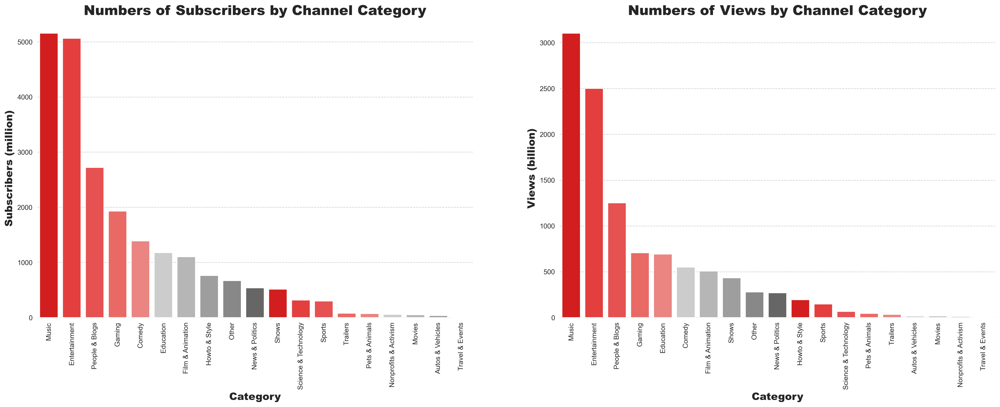

In [77]:
sb.set_style("whitegrid", {'axes.grid': True})
fig, ax = plt.subplots(1, 2, figsize=(25, 8), dpi =300)

# Subscribers chart
sb.barplot(data=subs_category, x='Category', y='Subscribers (million)', ax=ax[0], palette=youtube_color_barchart_10)
ax[0].set_title('Numbers of Subscribers by Channel Category', fontweight='heavy', fontsize=20)
ax[0].set_ylabel('Subscribers (million)', fontsize=15, fontweight='heavy')
ax[0].set_xlabel('Category', fontsize=15, fontweight='heavy')
ax[0].grid(axis='y', linestyle='--')
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)
ax[0].spines['bottom'].set_visible(False)
ax[0].spines['left'].set_visible(False)
plt.sca(ax[0])
plt.xticks(rotation=90)

# Views chart
sb.barplot(data=views_category, x='Category', y='Video Views (billion)', ax=ax[1], palette=youtube_color_barchart_10)
ax[1].set_title('Numbers of Views by Channel Category', fontweight='heavy', fontsize=20)
ax[1].set_ylabel('Views (billion)', fontsize=15, fontweight='heavy')
ax[1].set_xlabel('Category', fontsize=15, fontweight='heavy')
ax[1].grid(axis='y', linestyle='--')
ax[1].spines['top'].set_visible(False)
ax[1].spines['right'].set_visible(False)
ax[1].spines['bottom'].set_visible(False)
ax[1].spines['left'].set_visible(False)
plt.sca(ax[1])
plt.xticks(rotation=90)

plt.show()


#### Comments:
With just 2 categories, Music and Entertainment, they accounted for 47% of the total subscribers and 52% of the total views.
Among them, Music topped the rankings in both metrics with approximately 5.2 billion subscribers and over 3.1 trillion views.
Overall, both categories are highly entertaining across all platforms, and on YouTube, they are even more amplified. The numbers above provide us with an overview of YouTube user trends.
- Music
    - Global popularity: Music is a universal language. People worldwide love music and search for it on YouTube.
    - Famous artists: Many famous artists use YouTube to share their music, attracting a large fan base and viewership.
    - High quality: Music videos often have high quality visuals and audio, providing a great experience for viewers.
- Entertainment
    - Diverse entertainment content: The "Entertainment" category on YouTube includes various types of entertainment content, from personal vlogs and funny videos to challenges, video games, movie reviews, and more.
    - Creativity: Entertainment content is often diverse, promoting creative freedom for many individual YouTube channels.
    
Both categories provide viewers with a way to entertain, relax, and explore their interests, especially in the digital age when everything is changing rapidly, making the demand for entertainment increasingly prominent. This makes them the two most popular categories on YouTube.

## Question 7.How is user engagement in these categories measured (measured by views per subscriber)?

In [78]:
# Group subscribers and video views by categories
subs_views_category = youtube.groupby('Category').agg({'Subscribers': 'sum', 'Video Views': 'sum'})

# Create View-to-Subscriber Ratio
subs_views_category['View-to-Subscriber Ratio'] = subs_views_category['Video Views'] / subs_views_category['Subscribers']

# Sort values by View-to-Subscriber Ratio
subs_views_category.sort_values(by='View-to-Subscriber Ratio', ascending=False, inplace=True)

# Reset index
subs_views_category.reset_index(inplace=True)

# Show statistics table
print(subs_views_category)


                 Category  Subscribers    Video Views  \
0                   Shows    512600000   432356612140   
1          Pets & Animals     72400000    44866745899   
2                   Music   5155300000  3103516219048   
3               Education   1175400000   691690418531   
4         News & Politics    536400000   270391919347   
5                  Sports    298200000   147986290620   
6           Entertainment   5061400000  2500154780534   
7        Film & Animation   1101700000   507963782337   
8          People & Blogs   2720900000  1251773521276   
9                Trailers     78000000    33262717607   
10       Autos & Vehicles     35700000    15003458141   
11                  Other    669400000   278191674947   
12                 Comedy   1388500000   550112774315   
13                 Gaming   1928500000   706166809255   
14                 Movies     51300000    15383255129   
15          Howto & Style    760800000   194799530478   
16        Travel & Events     1

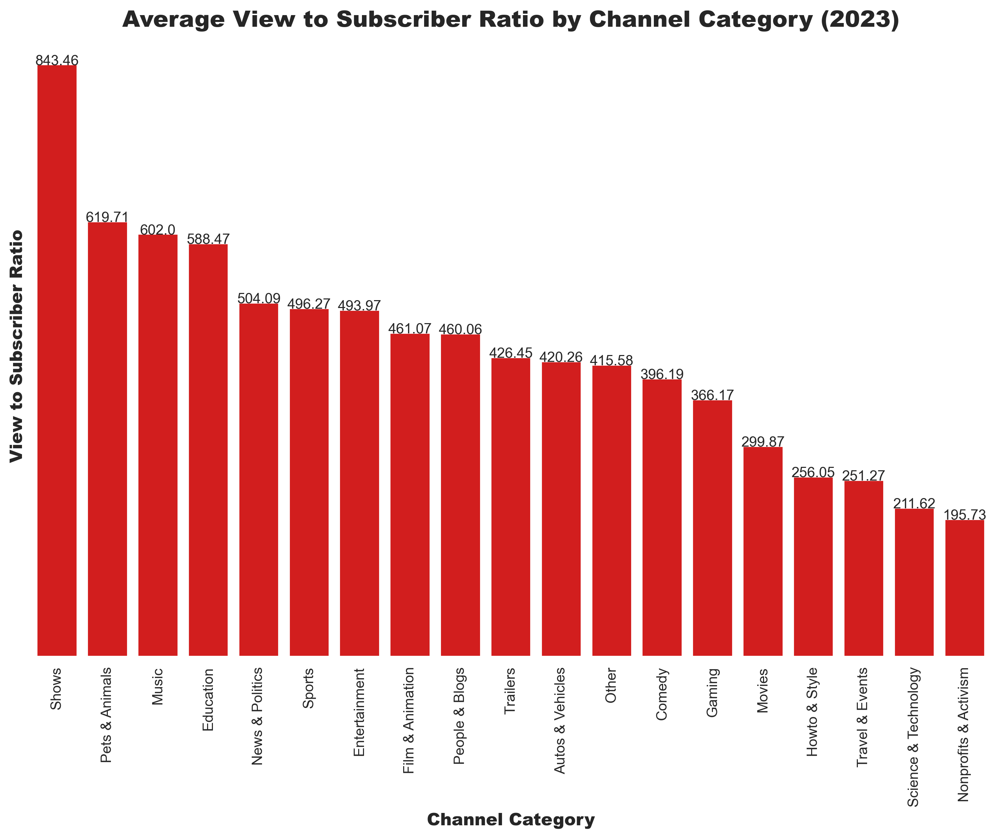

In [79]:
import matplotlib.pyplot as plt
import seaborn as sb

# Set style and create figure
sb.set_style("whitegrid", {'axes.grid': False})
plt.figure(figsize=(12, 8), dpi = 300)

# Convert variable to a list
labels = subs_views_category['View-to-Subscriber Ratio'].to_list()

# Chart
plt.title('Average View to Subscriber Ratio by Channel Category (2023)', fontweight='heavy', fontsize=16)
sb.barplot(data=subs_views_category, x='Category', y='View-to-Subscriber Ratio', color='#f00000')

# Add label for each column in chart
for i, value in enumerate(labels):
    plt.text(i, value + 0.1, round(value, 2), ha='center', fontsize=10)  # Adjust positioning to prevent overlap

# Customize labels, ticks, and spines
plt.xlabel('Channel Category', fontsize=12, fontweight='heavy')
plt.ylabel('View to Subscriber Ratio', fontsize=12, fontweight='heavy')
plt.xticks(rotation=90)
plt.yticks([])
sb.despine(left=True, bottom=True)

plt.show()


In [80]:
print('Average view-to-subscriber ratio across all categories:', round(subs_views_category['View-to-Subscriber Ratio'].mean(), 2))


Average view-to-subscriber ratio across all categories: 437.28


#### comment:
Average views per subscriber across all categories: 437.0

Observations:
The Show category leads with a 27% higher average view-to-subscriber ratio compared to the adjacent Pets & Animals category. This is truly surprising considering that this category previously had very modest subscriber and view counts (512 million subscribers and 432 billion views).

On the other hand, the two categories leading YouTube user trends have relatively average views per subscriber, with 602 for Music and 493 for Entertainment.

A high view-to-subscriber ratio indicates that:

A loyal fan base: Subscribers frequently return to watch when new content is uploaded, reflecting a strong connection between content creators and audiences.
High-quality content attracts high interaction levels: Engaging and trendy topics make subscribers feel positively about watching content regularly, with the potential to rewatch videos, resulting in more views per subscriber.
Compared to categories with low view-to-subscriber ratios, there may be some reasons for this:

Content virality: Channels may have a few viral videos that generate a large number of views at a given time but fail to maintain this consistently across all videos uploaded to the channel, thereby not converting views into subscribers.
Broad appeal: Content with broad appeal is often shared or posted on multiple platforms besides YouTube, attracting views from viewers who only browse rather than subscribe.
Search-friendly content: Channels create content that addresses common questions such as Howto & Style, Travel & Events, Science & Technology, or covers popular topics, making these videos highly discoverable through searches on YouTube or Google. However, after receiving the answers or information they need, viewers may not feel the need to subscribe.

## Question 8. Do the contents (characters) in the names of YouTube channels affect user views?

In [81]:
# Determine the 75th percentile of video views 
percentile_75th = youtube['Video Views'].quantile(0.75)

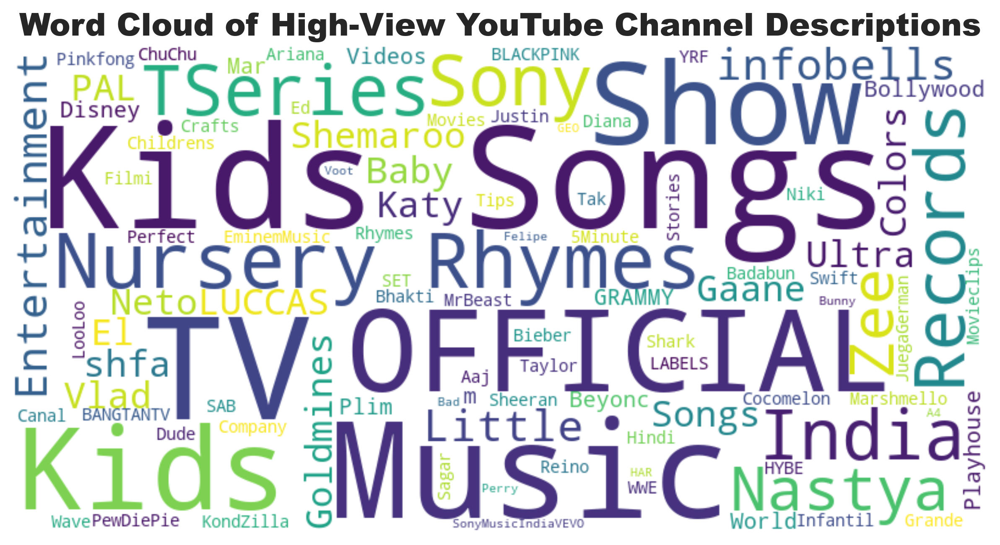

In [82]:
from wordcloud import WordCloud

# Filter channels with views above the 75th percentile
high_view_channels = youtube[youtube['Video Views'] > percentile_75th]
# Combine the names of high-view channels into a single string
text = ' '.join(high_view_channels['Youtuber'])

# Create the word cloud
wordcloud = WordCloud(background_color='white', width=800, height=400, max_words=100).generate(text)

# Plot the word cloud
plt.figure(figsize=(10, 8), dpi=300) 
plt.imshow(wordcloud, interpolation='bilinear') 
plt.axis('off')
plt.title('Word Cloud of High-View YouTube Channel Descriptions', fontsize=18, fontweight='heavy') 
plt.show()


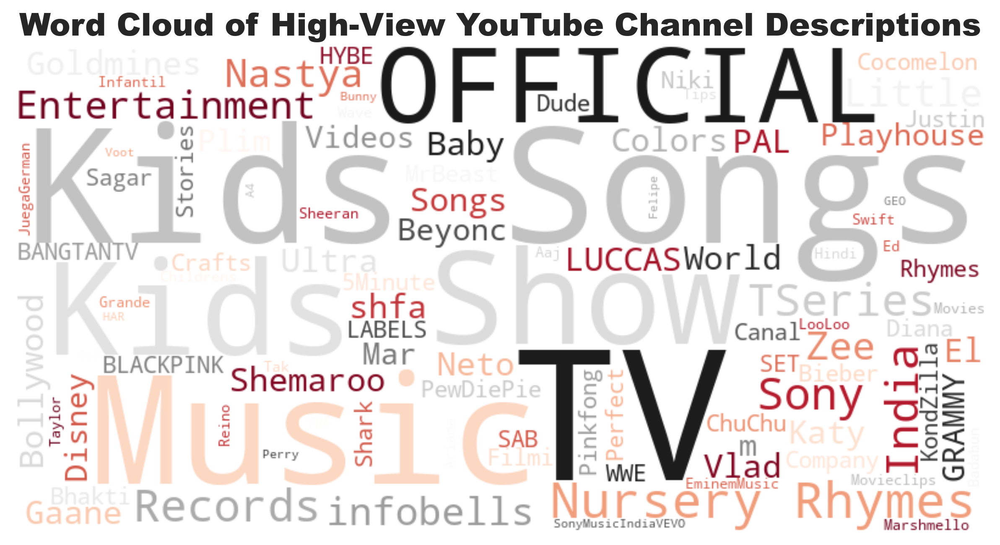

In [83]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Filter channels with views above the 75th percentile
high_view_channels = youtube[youtube['Video Views'] > percentile_75th]
# Combine the names of high-view channels into a single string
text = ' '.join(high_view_channels['Youtuber'])

# Create the word cloud with red and white colors and bold font
wordcloud = WordCloud(background_color='white', colormap='RdGy', width=800, height=400, max_words=100, max_font_size=150).generate(text)

# Plot the word cloud
plt.figure(figsize=(10, 8), dpi=300) 
plt.imshow(wordcloud, interpolation='bilinear') 
plt.axis('off')
plt.title('Word Cloud of High-View YouTube Channel Descriptions', fontsize=18, fontweight='heavy') 
plt.show()


#### Comment:

The most prominent words in the Word Cloud chart above, such as Music, Kids, Songs, Official, TV, Show, all have a significant relevance to the YouTube category trends of users as presented in the previous analyses, such as Music, Entertainment, Shows.

The close correlation between the characters in YouTube channel names and channel categories may be due to several reasons:

Brand clarity: Creators often want their channel names to reflect the type of content they produce. This helps potential users easily understand the focus of the channel. A suitable name aligned with the content can provide a clearer brand and set audience expectations.

Recognizability: Channels with keywords in their names that also match the category keywords may improve the channel's visibility in search results.

Consistency between name and content: If the channel name directly correlates with the category name, the channel will provide a consistent experience for viewers. For example, a channel named "Action Movies" in the Movies category would align with what users expect based on the name.

# Question 9 Distribution of YouTube Channels by Country (2023)


In [84]:
map_chart = youtube.groupby(['Country', 'Abbreviation'])[['Youtuber']].count().reset_index().rename(columns={'Youtuber': 'Count of Country'})
map_chart.reset_index(drop=True, inplace=True)
map_chart['Percent'] = round((map_chart['Count of Country'] / sum(map_chart['Count of Country'])) * 100, 1)
map_chart


,Country,Abbreviation,Count of Country,Percent
0,Afghanistan,AF,1,0.1
1,Andorra,AD,1,0.1
2,Argentina,AR,13,1.3
3,Australia,AU,8,0.8
4,Bangladesh,BD,1,0.1
5,Barbados,BB,1,0.1
6,Brazil,BR,61,6.3
7,Canada,CA,15,1.6
8,Chile,CL,3,0.3
9,China,CN,1,0.1


In [85]:
import plotly.graph_objs as go
import plotly.express as px

# Custom colorscale from white to red
custom_white_to_red_colorscale = [
    [0, "#FFFFFF"], [0.2, "#FFCCCC"], [0.4, "#FF9999"], [0.6, "#FF6666"],
    [0.8, "#FF3333"], [1, "#FF0000"]
]

# Create the choropleth map with the custom colorscale
fig = px.choropleth(map_chart,
                    locations='Country',
                    locationmode='country names',
                    color='Count of Country',
                    color_continuous_scale=custom_white_to_red_colorscale,
                    hover_name='Country',
                    title='Distribution of Channels per Country',
                    projection='equirectangular')

# Customize the colorbar title
fig.update_coloraxes(colorbar_title='Count of Country')

fig.update_layout(
    title=dict(text="Distribution of Channels per Country", x=0.5),
    title_font=dict(size=18),
    height=560,
    width=1200
)
fig.update_geos(
    showcountries=True
) 
fig.update_layout(
    geo=dict(
        showcoastlines=True,
        coastlinecolor="Black",
        showland=True,
        landcolor="LightGray",
        showocean=True,
        oceancolor="LightBlue"
    )
)

# scattergeo_trace = go.Scattergeo(
#     locationmode='country names',
#     locations=map_chart['Country'],  # Locations of countries
#     text=map_chart['Abbreviation'],  # Name of each country
#     mode='text',  # Text display mode
#     showlegend=False,  # Hide legend
#     textfont=dict(size=7, color='black', family='Arial')  # Set text boldness
# )
# Add scattergeo trace to the chart
# fig.add_trace(scattergeo_trace)


####  Comments
A notable part of this dataset is that up to 11% of channels lack specific country data. This missing data could relatively affect the number of channels from top countries.

The United States and India lead the world in the number of top YouTube channels in 2023, accounting for approximately 50% of the total channels in this dataset. The United States holds the highest position with 32%, equivalent to 306 channels, followed by India with 17%, equivalent to 168 channels.

Both countries have large populations along with a booming media industry. With Hollywood in the United States and Bollywood in India being the top film capitals in the world, many creators have turned to YouTube to share entertainment content.

=> So what makes the United States outperform other countries in terms of the number of successful YouTube channels?
Let's explore this through some characteristics of the data for each country in this dataset.
# 9.1. Unemployment rate in each country?

In [86]:
# Select data for the 'Unemployment Rate by Country' chart
unempl_rate = youtube[['Country', 'Unemployment Rate']].sort_values(by='Unemployment Rate', ascending=False).drop_duplicates().reset_index(drop=True)
unempl_rate.head()


,Country,Unemployment Rate
0,Jordan,14.72
1,United States,14.70
2,Spain,13.96
3,Turkey,13.49
4,Iraq,12.82


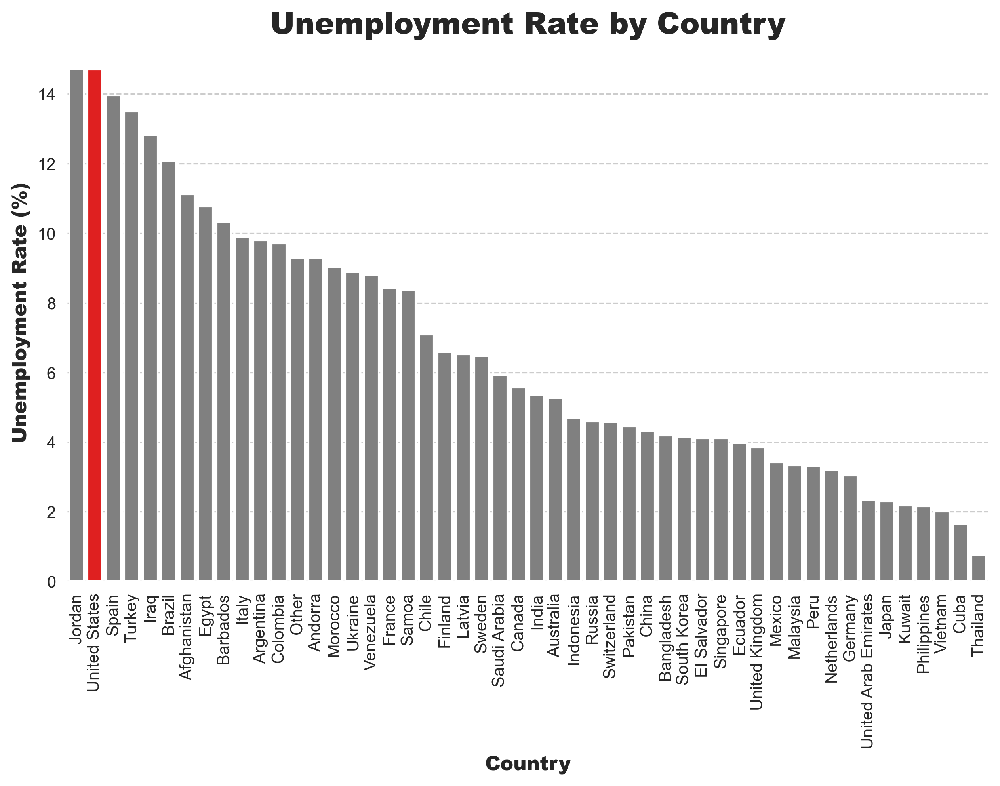

In [87]:
# Setup color for Unemployment Rate (%) chart
unempl_colors = []
for country in unempl_rate['Country']:
    if country == 'United States':
        unempl_colors.append('red')
    else:
        unempl_colors.append('gray')

# Chart
plt.figure(figsize=(10, 6), dpi=300)
sb.barplot(data=unempl_rate, x='Country', y='Unemployment Rate', palette=unempl_colors)
plt.title('Unemployment Rate by Country', fontweight='heavy', fontsize=18)
plt.xlabel('Country', fontweight='heavy', fontsize=12)
plt.ylabel('Unemployment Rate (%)', fontweight='heavy', fontsize=12)
plt.xticks(rotation=90)
sb.despine(left=True, bottom=True)
plt.grid(axis='y', linestyle='--')



#### comment:
The impact of unemployment rate in a country on the success of YouTube channels:

Content creation opportunity: YouTube provides an opportunity for unemployed individuals with high creativity to explore new avenues to improve their lives. Those who are creatively inclined have more time to focus on developing content and their channels during periods of unemployment.

Demand for educational and job-related content: During times of unemployment, there is a high demand for educational content and guidance on job searching or career development. Content creators can capitalize on this trend by helping viewers learn about writing resumes, interviewing, or developing professional skills.

# Question 9.2.University Enrollment Rate by Country?

In [88]:
# Select data for 'Gross Tertiary Education Enrollment Rate by Country chart'
education_rate = youtube[['Country', 'Gross Tertiary Education Enrollment (%)']].sort_values(by='Gross Tertiary Education Enrollment (%)', ascending=False).reset_index(drop=True)
education_rate = education_rate.drop_duplicates().reset_index(drop=True)
education_rate.head(10)


,Country,Gross Tertiary Education Enrollment (%)
0,Australia,113.1
1,South Korea,94.3
2,Argentina,90.0
3,Spain,88.9
4,Chile,88.5
5,United States,88.2
6,Finland,88.2
7,Latvia,88.1
8,Netherlands,85.0
9,Singapore,84.8


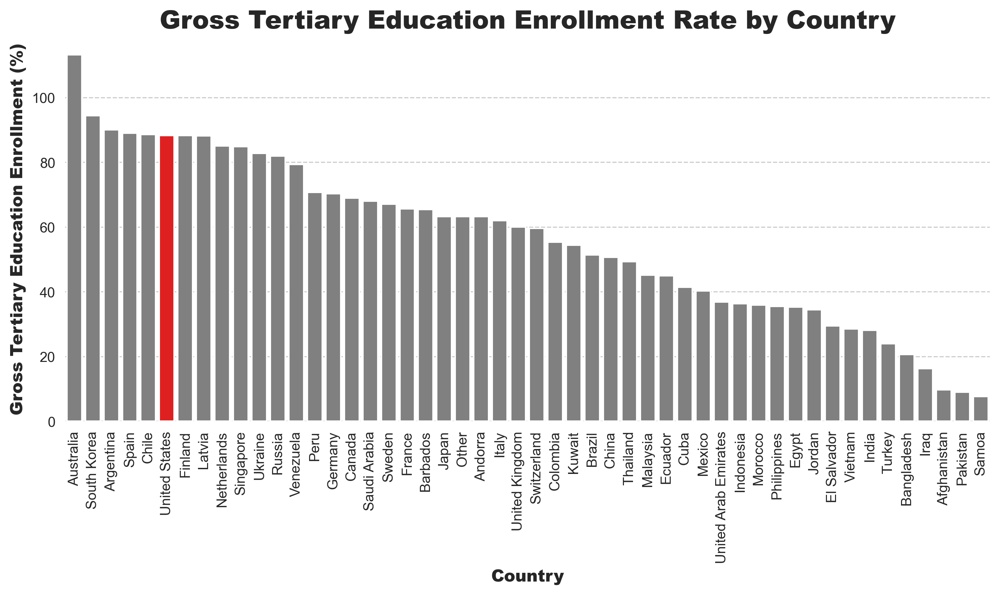

In [89]:
# Setup color for Gross Tertiary Education Enrollment Rate (%) chart
education_colors = []
for i in range(len(education_rate['Country'])):
    if education_rate['Country'][i] == 'United States':
        education_colors.append('red')
    else:
        education_colors.append('gray')

# Chart
plt.figure(figsize=(10, 6), dpi=300)
sb.barplot(data=education_rate, x='Country', y='Gross Tertiary Education Enrollment (%)', palette=education_colors)
plt.title('Gross Tertiary Education Enrollment Rate by Country', fontweight='heavy', fontsize=18)
plt.xlabel('Country', fontweight='heavy', fontsize=12)
plt.ylabel('Gross Tertiary Education Enrollment (%)', fontweight='heavy', fontsize=12)
plt.xticks(rotation=90)
sb.despine(left=True, bottom=True)
plt.grid(axis='y', linestyle='--')
plt.tight_layout()
plt.show()



#### Comment:
The Impact of Gross Tertiary Education Enrollment Rate (GTER) on the Success of YouTube Channels:

Content Quality: YouTube channels created by individuals with higher levels of education (GTER) may produce educational content, research-related material, and other academic fields that are more engaging and of higher quality.

Communication and Teaching Ability: Individuals with higher education levels may possess better teaching and communication skills, leading to more effective online learning methods.

Target Market: The tertiary education enrollment rate of a country indicates a potential market for educational content categories on YouTube in that country. Countries with high GTER may experience higher demand for educational and instructional content.

# Question 9.3. Urban Population Rate of Each Country?

In [90]:
# Create column 'Urbanization Rate (%)' in the YouTube dataset
youtube['Urbanization Rate (%)'] = round((youtube['Urban Population'] / youtube['Population']) * 100, 0)

# Select data for 'Urbanization Rate (%) by Country' chart
urban_rate = youtube[['Country', 'Abbreviation', 'Urbanization Rate (%)']].sort_values(by='Urbanization Rate (%)', ascending=False)
urban_rate = urban_rate.drop_duplicates().reset_index(drop=True)
urban_rate.head(20)


,Country,Abbreviation,Urbanization Rate (%)
0,Singapore,SG,100.0
1,Kuwait,KW,100.0
2,Argentina,AR,92.0
3,Japan,JP,92.0
4,Netherlands,NL,92.0
5,Jordan,JO,91.0
6,Venezuela,VE,88.0
7,Sweden,SE,88.0
8,Chile,CL,88.0
9,United Arab Emirates,AE,87.0


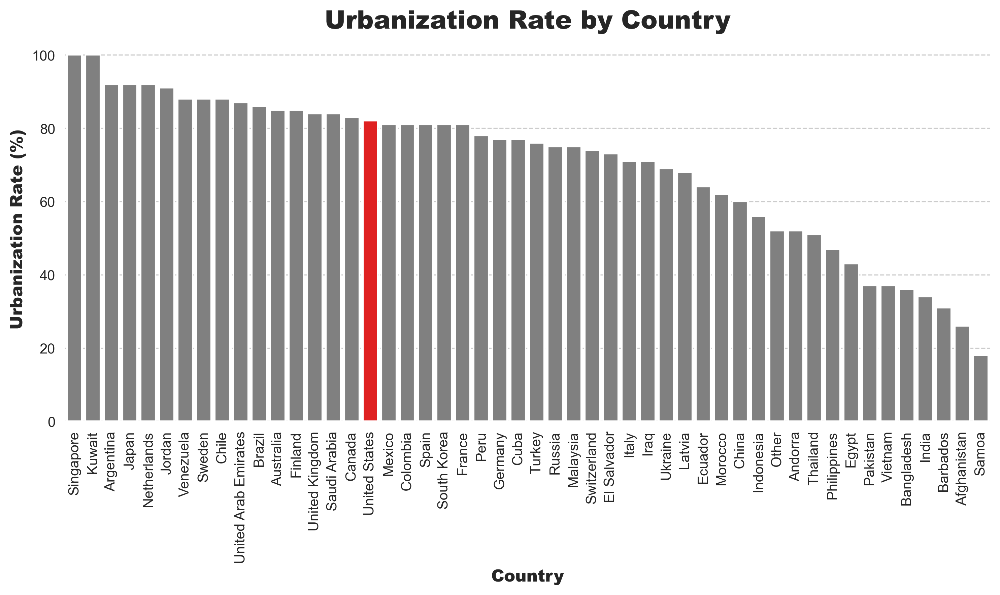

In [91]:
# Setup color for Urbanization Rate (%) chart
urban_colors = []
for i in range(len(urban_rate['Country'])):
    if urban_rate['Country'][i] == 'United States':
        urban_colors.append('red')
    else:
        urban_colors.append('gray')
# Chart
plt.figure(figsize=(10, 6), dpi=300)
sb.barplot(data=urban_rate, x='Country', y='Urbanization Rate (%)', palette=urban_colors)
plt.title('Urbanization Rate by Country', fontweight='heavy', fontsize=18)
plt.xlabel('Country', fontweight='heavy', fontsize=12)
plt.ylabel('Urbanization Rate (%)', fontweight='heavy', fontsize=12)
plt.xticks(rotation=90)
sb.despine(left=True, bottom=True)
plt.grid(axis='y', linestyle='--')
plt.tight_layout()
plt.show()


#### comment:
The impact of urban population rate on the success of YouTube channels:
- Internet Accessibility: Urban areas typically have better internet infrastructure and connectivity compared to rural areas. Therefore, urban residents have faster and more stable internet access, making it easier for them to access and consume content on YouTube.
- Demand for Urban Content: Urban residents often have a demand for content related to urban life, urban culture, and social issues related to urban areas. YouTube channels creating content on these topics can attract a large audience in urban areas.
- Better Advertising Market: Urban areas usually have a more developed advertising market, and content creators living in urban areas may have better opportunities to collaborate with advertisers and earn money from advertising on YouTube.
- Targeting a Larger Audience: Urban areas typically have larger populations, meaning YouTube channels have the potential to reach a larger target audience.

### Conclusion:
From the observations above, we can provide some evidence as to why the United States has become the country with the most successful YouTube channels:
- According to Wikipedia and MS News, the United States is the third most populous country in the world with 336 million people. Of these, the unemployment rate is up to 14.7%, equivalent to 49 million people, a significant number.
- With the difficulties in unstable employment, some alternative paths may become relatively ideal choices, including building a personal YouTube channel. In the United States, a country with diverse topics in life, where anyone with their creativity can find content to exploit on the YouTube platform.
- Furthermore, the United States has the highest education system globally. With an 88.2% participation rate in higher education, this is a significant advantage as the workforce here has a very high level of education. From those with high levels of education, they can create higher quality, more engaging content in areas related to education, research, etc. Moreover, these individuals will have excellent communication skills, helping viewers easily access knowledge.
- In a country where the education system ranks at the top globally, continuous learning is essential. Currently, learning is not limited to the classroom but has expanded to various platforms thanks to the strong transformation of the Internet. And the Education category on YouTube is evidence of this, always ranking in the top 5 categories with the highest number of followers and views, with 588 views per subscriber, showing this is a potential category that highly educated individuals can exploit strongly.
- Finally, the location is a condition for the development of the two points mentioned above. With 82% of the population living in urban areas, where people have easy access to the Internet and can use multiple platforms, including YouTube. When the urban population is high, the content trend of users is also broader. Along with that is a good opportunity to increase collaboration and advertising with companies or brands through sponsorship contracts, helping urban YouTube channels have the potential to earn more money.

# Question 10.The most successful YouTube channels were established in which year?

In [92]:
cnt_created_year = youtube.groupby('Created Year').size().to_frame().reset_index().rename(columns={0: 'Count'})
cnt_created_year = cnt_created_year.sort_values(by='Count', ascending=False)
cnt_created_year

,Created Year,Count
9,2014,95
1,2006,89
6,2011,81
11,2016,76
8,2013,71
10,2015,70
7,2012,68
12,2017,63
4,2009,52
2,2007,49


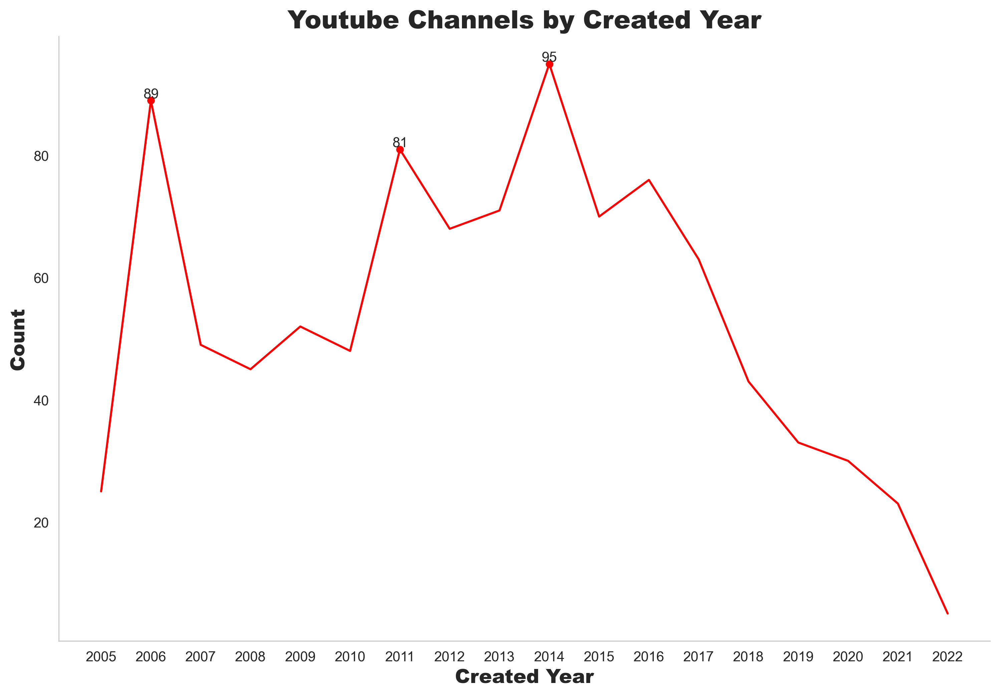

In [93]:
import seaborn as sb
import matplotlib.pyplot as plt

sb.set_style("whitegrid", {'axes.grid': False})
plt.figure(figsize=(12, 8), dpi=300)
plt.title('Youtube Channels by Created Year', fontweight='heavy', fontsize=18)
sb.lineplot(data=cnt_created_year, y='Count', x='Created Year', color='red')
label_points = [(2014, 95), (2006, 89), (2011, 81)]
for point in label_points:
    plt.text(point[0], point[1], f'{point[1]}', ha='center', va='bottom')
for point in label_points:
    x, y = point
    plt.scatter(x, y, color='red', marker='o', s=20)
plt.xlabel('Created Year', fontweight='heavy', fontsize=14)
plt.ylabel('Count', fontweight='heavy', fontsize=14)
sb.despine(left=False, bottom=False)
plt.xticks(cnt_created_year['Created Year'])
plt.show()


#### comment:
It can be seen that the milestones for the emergence of the most successful YouTube channels are concentrated in 3 years: 2006, 2011, and 2015.

The emergence of YouTube: Founded and publicly launched in 2005, but it was not until 2006 that YouTube truly began to attract widespread attention and significant development. During this period, the YouTube platform was still new, and the competition was not too fierce, allowing many channels to quickly emerge and build a loyal fan base in the early days.

Platform's growth drive: According to Wikipedia, there were over three billion views per day and 48 hours of footage uploaded per minute in 2011. The platform grew rapidly and became an indispensable part of people's daily lives. The Google+ social network was directly integrated with YouTube and the Chrome web browser, laying the foundation for interaction between viewers and content creators. Additionally, 2011 saw the emergence of various content genres including entertainment, tutorials, vlogs, gaming, etc., opening up many opportunities for content creators on YouTube.

Social media integration: In 2015, the explosion of social media platforms such as Facebook and Twitter along with the integration of YouTube brought a large number of viewers to the channels. Furthermore, the development of smartphones and mobile apps diversified the YouTube user base. Along with the growth of online advertising, many YouTube channels attracted investment from advertising companies, thereby generating stable income streams. This led to the emergence of many YouTube channels during this period, viewed as a lucrative profession.

# Question 11. What are the content creation trends over time for these channels?

In [94]:
top_cnt_channel_by_year = youtube.groupby(['Created Year', 'Category'])['Youtuber'].count().reset_index().sort_values(by=['Created Year', 'Category'])
top_cnt_channel_by_year.reset_index(drop=True, inplace=True)
top_cnt_channel_by_year

,Created Year,Category,Youtuber
0,2005,Comedy,1
1,2005,Entertainment,5
2,2005,Gaming,1
3,2005,Howto & Style,1
4,2005,Music,9
...,...,...,...
179,2021,Other,5
180,2021,People & Blogs,7
181,2022,Entertainment,2
182,2022,Other,2


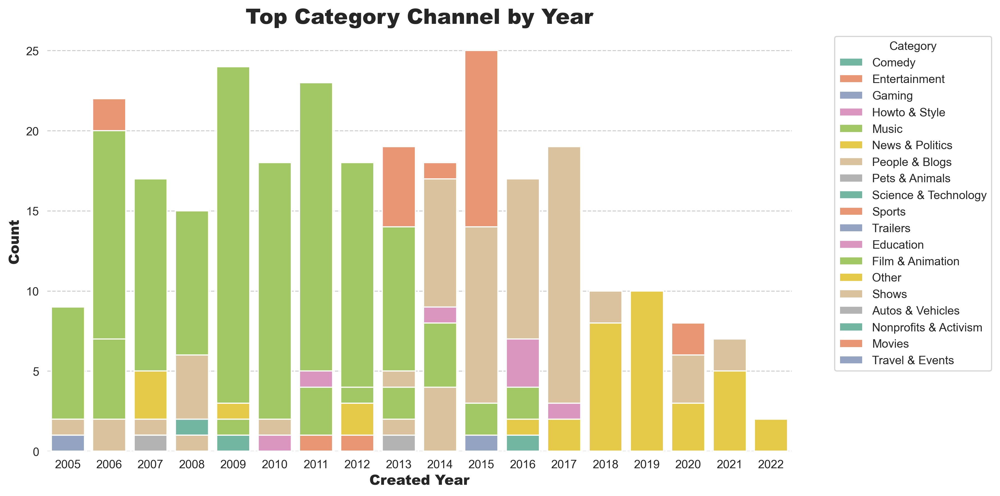

In [95]:
plt.figure(figsize=(12, 6), dpi=300)
sb.barplot(data=top_cnt_channel_by_year, x='Created Year', y='Youtuber', hue='Category', dodge=False, palette='Set2')  # Change palette to 'Set2'
plt.title('Top Category Channel by Year', fontweight='heavy', fontsize=18)
plt.xlabel('Created Year', fontweight='heavy', fontsize=12)
plt.ylabel('Count', fontweight='heavy', fontsize=12)
plt.xticks(rotation=0, ha='center')
sb.despine(left=True, bottom=True)
plt.grid(axis='y', linestyle='--')
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


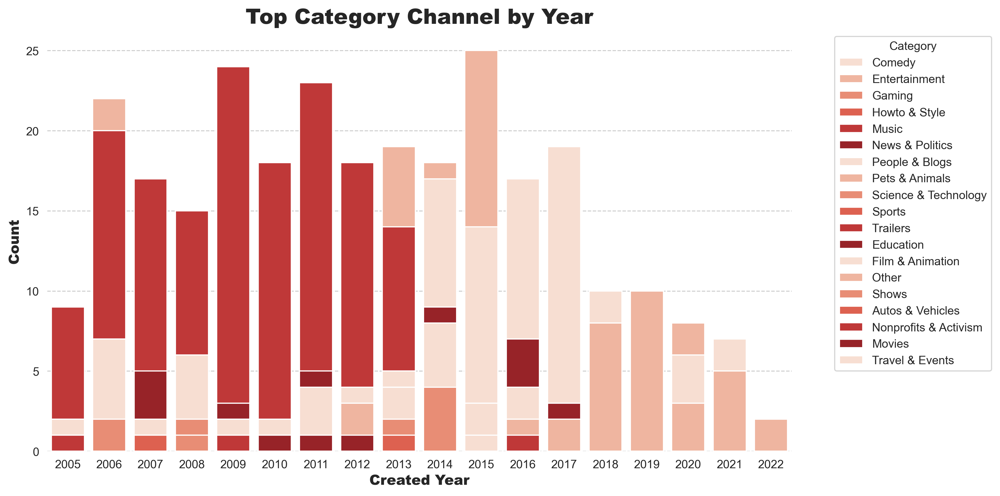

In [96]:
import seaborn as sns
import matplotlib.pyplot as plt

# Generate a red to white color palette
red_to_white_palette = sns.color_palette("Reds", n_colors=6)

# Plot using the generated color palette
plt.figure(figsize=(12, 6), dpi=300)
sns.barplot(data=top_cnt_channel_by_year, x='Created Year', y='Youtuber', hue='Category', dodge=False, palette=red_to_white_palette)
plt.title('Top Category Channel by Year', fontweight='heavy', fontsize=18)
plt.xlabel('Created Year', fontweight='heavy', fontsize=12)
plt.ylabel('Count', fontweight='heavy', fontsize=12)
plt.xticks(rotation=0, ha='center')
sns.despine(left=True, bottom=True)
plt.grid(axis='y', linestyle='--')
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [97]:
filtered_youtube = youtube[((youtube['Created Year'] > 2012) & (youtube['Created Year'] < 2016)) & (youtube['Category'] == 'Comedy')]
filtered_youtube

,Youtuber,Subscribers,Video Views,Uploads,Category,Country,Abbreviation,Lowest Monthly Earnings,Highest Monthly Earnings,Gross Tertiary Education Enrollment (%),Unemployment Rate,Population,Urban Population,Created Year,Urbanization Rate (%)
55,whinderssonnunes,44200000,4274709210,558,Comedy,Brazil,BR,6700.0,106700.0,51.3,12.08,212559417,183241641,2013,86.0
73,CarryMinati,39200000,3294013141,186,Comedy,India,IN,19700.0,314800.0,28.1,5.36,1366417754,471031528,2014,34.0
120,KHANDESHI MOVIES,33500000,11405809704,217,Comedy,India,IN,6200.0,98900.0,28.1,5.36,1366417754,471031528,2013,34.0
248,Alejo Igoa,24100000,10999000479,802,Comedy,Argentina,AR,100400.0,1600000.0,90.0,9.79,44938712,41339571,2014,92.0
314,Topper Guild,21900000,15552070846,816,Comedy,United States,US,171800.0,2700000.0,88.2,14.70,328239523,270663028,2014,82.0
331,YOLO,21400000,1573058816,0,Comedy,Germany,DE,0.0,0.0,70.2,3.04,83132799,64324835,2013,77.0
380,Noor Stars,20200000,2764127969,693,Comedy,United Arab Emirates,AE,3900.0,62200.0,36.8,2.35,9770529,8479744,2014,87.0
420,TheOdd1sOut,19100000,4566120190,139,Comedy,United States,US,7700.0,123900.0,88.2,14.70,328239523,270663028,2014,82.0
435,Triggered Insaan,18800000,3276891538,304,Comedy,India,IN,27300.0,436100.0,28.1,5.36,1366417754,471031528,2014,34.0
475,Lele Pons,17900000,5244917119,185,Comedy,United States,US,4600.0,74200.0,88.2,14.70,328239523,270663028,2015,82.0


The categories Music and Entertainment are the top two content creation trends of the most successful YouTube channels, appearing in 14 out of 18 years of the platform's formation and development.

We can easily observe a clear trend of channel establishment shifting from the music field to entertainment. Specifically:

During the period from 2007 to 2012: The trend in channel creation focused on the music category. During this period, as the internet was booming, music also rapidly evolved from traditional formats like CDs and tapes to online music platforms such as Apple's iTunes in 2003 and Spotify in 2006. In 2005, YouTube emerged as a historic milestone for the music industry, where people could enjoy videos tailored to their individual preferences anywhere with an internet connection. Video content with both audio and visuals, provided for free by YouTube, directly competed with previous music streaming platforms.

During the period from 2013 to 2022: The trend in channel creation mainly focused on the Entertainment category, although not as dominant as the previous music trend. In the following three years after the development of the music trend, YouTube started gaining popularity. Increasing user numbers drove creative content on this platform beyond just music development. Entertainment emerged as an essential need in people's daily lives. The robust development of entertainment content on YouTube began in 2013 and peaked in the number of successful channels in 2015.

As time progressed, user trends became more diverse. In the period of strong entertainment trend development, the People & Blogs theme emerged as a trend. From 2016 to 2017, the development of social networks and integrated video content propelled the growth of People & Blogs content channels. Content about daily life, vlogs, and personal conversations attracted millions of views and followers worldwide.

Regarding the average monthly revenue potential for each category, it would depend on various factors such as the number of subscribers, views, engagement rates, and monetization strategies employed by creators within each category. Analyzing revenue potential would require access to specific channel data and metrics related to monetization, which may not be readily available without further analysis.

# Question 12.What is the average monthly revenue potential for each category?

In [98]:
potentially_lucrative = youtube[['Category', 'Lowest Monthly Earnings', 'Highest Monthly Earnings']] 
potentially_lucrative.sample(5)


,Category,Lowest Monthly Earnings,Highest Monthly Earnings
207,Entertainment,180500.0,2900000.0
842,Entertainment,482.0,7700.0
379,Gaming,16100.0,258000.0
504,Entertainment,59000.0,944000.0
308,Entertainment,34800.0,557300.0


In [99]:
potentially_lucrative['Average Monthly Earnings'] = (potentially_lucrative['Lowest Monthly Earnings'] + potentially_lucrative['Highest Monthly Earnings']) / 2
potentially_lucrative.sample(5)

,Category,Lowest Monthly Earnings,Highest Monthly Earnings,Average Monthly Earnings
672,Entertainment,36400.0,581900.0,309150.0
440,Other,10800.0,173600.0,92200.0
308,Entertainment,34800.0,557300.0,296050.0
922,People & Blogs,0.0,0.0,0.0
461,Entertainment,124300.0,2000000.0,1062150.0


In [100]:
category_avg_earnings = potentially_lucrative.groupby('Category')['Average Monthly Earnings'].mean().reset_index()
category_avg_earnings['Average Monthly Earnings (1000$)'] = (category_avg_earnings['Average Monthly Earnings'] / 1000)
category_avg_earnings.sort_values(by='Average Monthly Earnings (1000$)', ascending=False, inplace=True)
category_avg_earnings.reset_index(drop=True, inplace=True)
category_avg_earnings


,Category,Average Monthly Earnings,Average Monthly Earnings (1000$)
0,Shows,1.239268e+06,1239.268182
1,Other,6.365854e+05,636.585434
2,Autos & Vehicles,5.773250e+05,577.325000
3,Sports,4.285000e+05,428.500000
4,Pets & Animals,4.222039e+05,422.203875
5,Film & Animation,3.924375e+05,392.437468
6,Education,3.766251e+05,376.625104
7,Comedy,3.550899e+05,355.089877
8,News & Politics,3.414123e+05,341.412293
9,Entertainment,3.384038e+05,338.403767


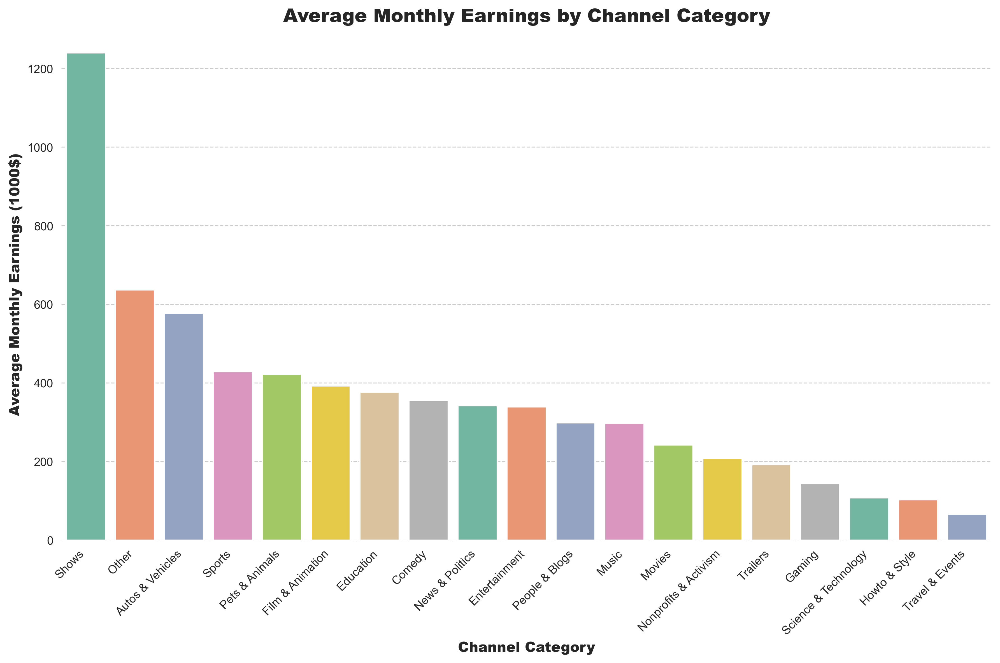

In [101]:
plt.figure(figsize=(12,8), dpi=300)
sb.barplot(data=category_avg_earnings, x='Category', y='Average Monthly Earnings (1000$)', palette='Set2')  # Corrected the palette name to 'Set2'
plt.title('Average Monthly Earnings by Channel Category', fontweight='heavy', fontsize=16)
sb.despine(left=True, bottom=True)
plt.grid(axis='y', linestyle='--')
plt.xlabel('Channel Category', fontweight='heavy', fontsize=12)
plt.ylabel('Average Monthly Earnings (1000$)', fontweight='heavy', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotating x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent overlapping elements
plt.show()


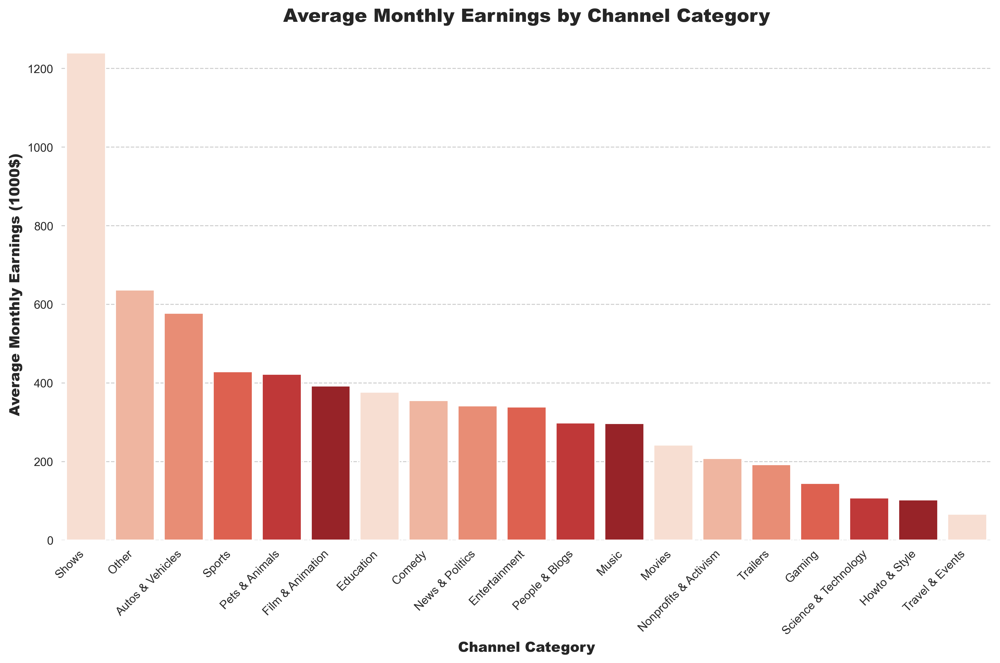

In [102]:
#  try different color

# Generate a red to white color palette
red_to_white_palette = sns.color_palette("Reds", n_colors=6)

plt.figure(figsize=(12, 8), dpi=300)
sns.barplot(data=category_avg_earnings, x='Category', y='Average Monthly Earnings (1000$)', palette=red_to_white_palette)
plt.title('Average Monthly Earnings by Channel Category', fontweight='heavy', fontsize=16)
sns.despine(left=True, bottom=True)
plt.grid(axis='y', linestyle='--')
plt.xlabel('Channel Category', fontweight='heavy', fontsize=12)
plt.ylabel('Average Monthly Earnings (1000$)', fontweight='heavy', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Comments:

Some channels unable to determine the category have their average monthly earnings incorrectly placed at the second position on the ranking table. This anomaly is due to the lack of category data. It does not significantly impact other categories, as it only accounts for about 3% of the data and may be considered negligible in the analysis of the chart.
Shows stand out as the most lucrative category for channel monetization, ranking first with an average monthly earnings exceeding $1.2 million. This figure is more than double compared to the adjacent category. The characteristic of shows is their ability to collaborate with production companies or other commercial partners to create advertising content, thereby attracting sponsorship from third parties and significantly increasing revenue.
Despite previous analyses indicating that Music and Entertainment are the top popular categories, it is surprising that they rank lower in terms of earning potential. This difference raises questions about the relationship between viewership, popularity, and revenue potential on this platform. A YouTube channel with high income does not necessarily depend solely on user views but may come from a variety of other income sources.

# Question 13: Does higher viewership lead to higher channel revenue?

In [103]:
# Select 4 columns (Youtuber, Video Views, Lowest Monthly Earnings and Highest Monthly Earnings)
views_earnings = youtube[['Youtuber', 'Video Views', 'Lowest Monthly Earnings', 'Highest Monthly Earnings']]

# Add column Avg for Earnings
views_earnings['Average Monthly Earnings'] = (views_earnings['Lowest Monthly Earnings'] + views_earnings['Highest Monthly Earnings']) / 2

# Change the unit of Earnings (1000$)
views_earnings['Average Monthly Earnings (1000$)'] = views_earnings['Average Monthly Earnings'] / 1000

# Change the unit of Video Views (billion)
views_earnings['Video Views (billion)'] = (views_earnings['Video Views'] / 1_000_000_000).astype('int')

# Select final columns
views_earnings = views_earnings[['Youtuber', 'Video Views (billion)', 'Average Monthly Earnings (1000$)']]

# Show statistics table
views_earnings.head()


,Youtuber,Video Views (billion),Average Monthly Earnings (1000$)
0,TSeries,228,4782.30
1,MrBeast,28,2868.50
2,Cocomelon Nursery Rhymes,164,4196.90
3,SET India,148,3877.95
4,Kids Diana Show,93,1541.45


In [104]:
# Calculate the correlation coefficient
correlation = views_earnings['Average Monthly Earnings (1000$)'].corr(views_earnings['Video Views (billion)'])


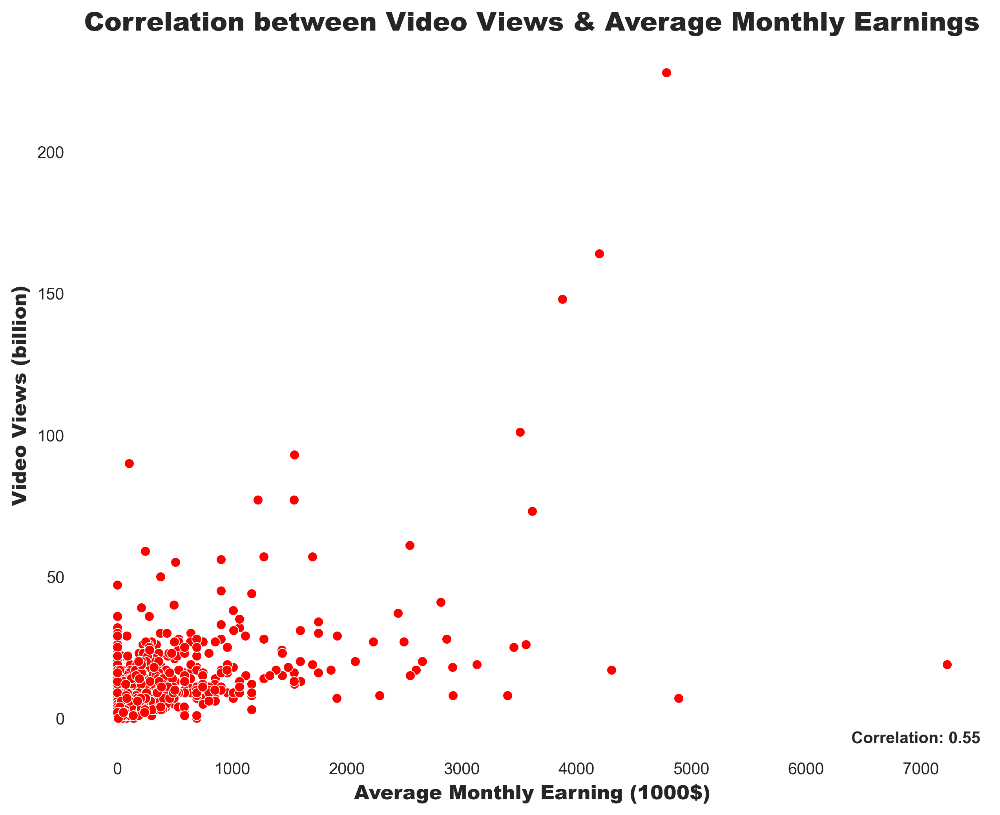

In [105]:
# Generate a red to white color palette
red_to_white_palette = sns.color_palette("Reds", n_colors=6)

# Edit chart
sns.set_style("whitegrid", {'axes.grid': False})
plt.figure(figsize=(10, 8), dpi=300)
sns.scatterplot(data=views_earnings, x='Average Monthly Earnings (1000$)', y='Video Views (billion)', color='red')  # Set dot color to red
plt.title('Correlation between Video Views & Average Monthly Earnings', fontsize=16, fontweight='heavy')
plt.xlabel('Average Monthly Earning (1000$)', fontsize=12, fontweight='heavy')
plt.ylabel('Video Views (billion)', fontsize=12, fontweight='heavy')
sns.despine(left=True, bottom=True)  # Changed left and bottom to True to remove spines only on left and bottom
plt.grid(axis='y', linestyle='')  # Removed y-axis grid lines
# Note correlation
correlation = views_earnings['Average Monthly Earnings (1000$)'].corr(views_earnings['Video Views (billion)'])  # Calculate correlation
plt.annotate(f'Correlation: {correlation:.2f}', xy=(0.85, 0.01), xycoords='axes fraction', fontsize=10, weight='bold')
plt.show()


#### Analysis:

While there is a positive relationship, the correlation is not extremely strong. This suggests that high viewership alone does not guarantee corresponding high income. Other factors such as video duration, user engagement, or ad placement location may influence channel revenue.

The quality of the video may be more important than the absolute number (e.g., viewer retention rate, click-through rate). Channels focusing on creating engaging, high-quality content to attract loyal users may generate higher average monthly earnings even with fewer views.

This correlation somewhat reinforces the previous argument that successful YouTube channels may have diverse revenue sources. Revenue from merchandise sales, sponsored content, affiliate marketing, and fan contributions make them less reliant on traditional advertising revenue or user views.

# Conclusion:

There are many factors determining the success of a YouTube channel, and while this analysis is based on the provided variables, more data is needed to provide deeper and more useful insights for those looking to engage with this platform.

Some determinants of a YouTube channel's success and the main trends that can be drawn from this dataset include:

Determinants of Success:

- Loyal Subscribers: Channels with a strong subscriber base tend to attract more video views. Building a loyal subscriber base takes time and requires effective content from channel creators. This is why channels built at critical milestones tend to succeed. Overall, it's a process of persistence and continuous creativity.

- Appropriate Content Selection: Categories like Entertainment, Music, Gaming, or Comedy have an advantage in popularity. Channels creating content from these categories often attract more viewers, especially in entertainment and music. Education and How-to & Style are relatively high-ranking categories, though not as high, indicating their importance to the audience. Shows have the highest view ratio per subscriber, implying loyal channel followers and high-quality content. However, some categories with viral or search-friendly content are not very effective, as seen with the Travel & Events category.

- Revenue Sources Beyond Views: While views have a positive correlation with income, it's not particularly strong. Channel revenue may depend on factors like interaction level, video duration, or ad placement, limiting the dataset's ability to discern effective income sources. However, overall, Shows are offering significant earning potential, despite music and entertainment being more popular.

- Quality Over Quantity: As seen in the previous analysis, uploading many videos does not necessarily result in more subscribers or corresponding views. Top YouTubers prioritize quality content because content is the most critical factor. Videos must provide value to viewers, be engaging, and satisfy the target audience's needs.

- Consistency: There's always a close connection between video content, channel category, and channel name. This connection makes it easier for viewers to find the content they need, increasing the chances of recommendations when there's a search query, helping channels reach a wide audience.

User Trends Through Most Successful YouTube Channels:
- In the past, in the first half of YouTube's development history, Music was the main user trend, lasting continuously for six years (from 2007 to 2012). From the later period until now, user trends have gradually shifted more towards entertainment content, with Entertainment being prominent.

- Music and entertainment are currently the two most popular categories on the platform (always leading in terms of subscribers and views). However, the Show category has the highest user view ratio per subscriber, indicating that Shows currently have content attracting potential customers, those who can replay content on the channel.

- There is a common trend among all three categories mentioned above, all of which are creating diverse entertainment content for users.

Recommendations for Building an Effective YouTube Channel in the Future:

- Identify Content and Build a Suitable User Group: In a rapidly changing world with increasingly diverse topics, finding suitable content for your creative abilities and then identifying related target groups is the first step when stepping into this platform.

- Quality Content: As mentioned throughout the analysis, content is always the top priority. A channel with engaging and audience-satisfying videos will have the ability to convert views into subscriptions.

- Interaction with Viewers: Comment responses, social media interaction, and building a supportive community are crucial in building loyal subscribers.

- Share Across Linked Platforms: Through several platforms linked to YouTube, sharing videos and content (release schedule, video demos, teasers, etc.) on social media pages can help increase recognition and reach the target audience.

- SEO (Search Engine Optimization): Optimize both video content and descriptions to increase the likelihood of appearing in search results on YouTube.

- Building Personal Branding: Continuously updating and supplementing necessary knowledge to develop deep knowledge of the main content your channel is exploiting. Try to leverage your creativity to create unique, standout content compared to other channels.

- Time and Patience: Building a channel and creating a large number of loyal users is a long-term process. Persistence, relentless effort to keep up with the times, is something every YouTuber needs to have.

# *THANK YOU !*